# Predicting COVID using ML

## Import Packages and Libraries

In [2]:
from pgmpy.models import BayesianNetwork
from pgmpy.estimators import MaximumLikelihoodEstimator, BayesianEstimator, ParameterEstimator
from pgmpy.inference import VariableElimination
from pgmpy.factors.discrete import TabularCPD
from pgmpy.inference.CausalInference import CausalInference

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
from keras.models import Sequential
from keras.layers import Dense
from keras.metrics import AUC
from imblearn.over_sampling import SMOTE

import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import daft
from daft import PGM

import sys
import psutil
import os
import gc

/opt/homebrew/anaconda3/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
#importing data
covid = pd.read_csv("loncov.csv")
covid.head(2)

,sex,education,occupation,occupation_covid,smoking,alcohol,drugs,past_history_covid,diabetes,hypertension,...,Cold,Fatigue,OtherSymptoms,date_diff_four_4_classes,vaccine_dose,vaccine_type,vaccine_effect,Age_group,obesity,under_cond
0,1,0,0,0,0,0,0,1,0,0,...,0,1,0,1,2,2,1,2,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,2,2,0,2,0,0


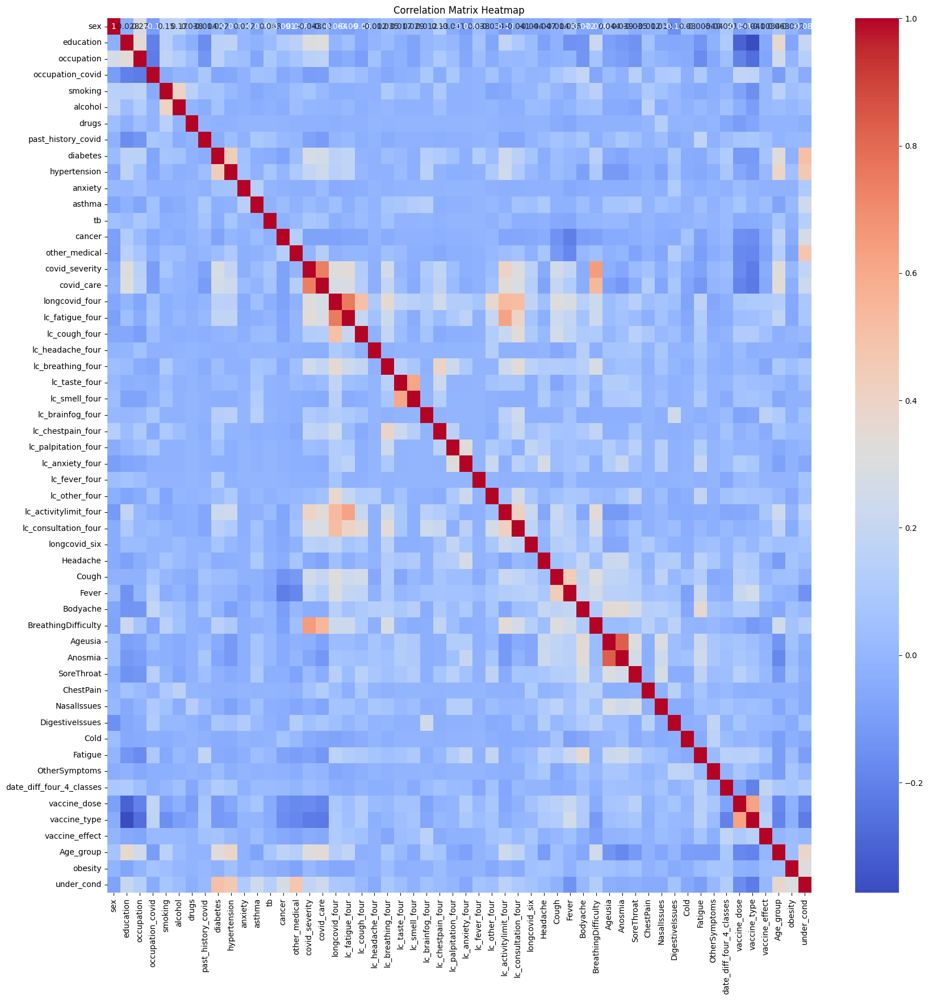

In [5]:
import seaborn as sns
import numpy as np
correlation_matrix = np.corrcoef(covid, rowvar=False)

# Create a heatmap using seaborn
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm',xticklabels=covid.columns,
            yticklabels=covid.columns)
plt.title("Correlation Matrix Heatmap")
plt.show()

# Decision Tree

In [17]:
from sklearn.tree import DecisionTreeClassifier, plot_tree


In [29]:
def train_and_evaluate_dt(X, y, depths=[None]):
    all_results = []
    
    for max_depth in depths:
        kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

        accuracies = []
        roc_aucs = []
        pr_aucs = []
        precisions = []
        recalls = []
        f1s = []
        specificities = []
        computation_times = []
        train_scores = []
        val_scores = []

        # Lists for ROC and PR curves
        tpr_all = []
        fpr_all = np.linspace(0, 1, 100)
        precisions_curve_all = []
        recalls_curve_all = np.linspace(0, 1, 100)

        for train_idx, val_idx in kfold.split(X, y):
            start_time = time.time()

            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            dt = DecisionTreeClassifier(max_depth=max_depth, random_state=0)
            dt.fit(X_train, y_train)

            y_pred = dt.predict(X_val)
            y_pred_prob = dt.predict_proba(X_val)[:, 1]

            # Compute metrics
            accuracy = accuracy_score(y_val, y_pred)
            precision = precision_score(y_val, y_pred)
            recall = recall_score(y_val, y_pred)
            f1 = f1_score(y_val, y_pred)
            roc_auc = roc_auc_score(y_val, y_pred_prob)
            precision_curve, recall_curve, _ = precision_recall_curve(y_val, y_pred_prob)
            pr_auc = auc(recall_curve, precision_curve)
            tn, fp, fn, tp = confusion_matrix(y_val, y_pred).ravel()
            specificity = tn / (tn + fp)

            end_time = time.time()
            elapsed_time = end_time - start_time  # Compute time in seconds

            # Collect train and validation scores for learning curve
            train_sizes, train_scores_fold, val_scores_fold = learning_curve(
                DecisionTreeClassifier(max_depth=max_depth, random_state=0),
                X_train,
                y_train,
                cv=kfold,
                n_jobs=-1
            )
            train_scores.append(train_scores_fold)
            val_scores.append(val_scores_fold)

            # Append metrics for later averaging
            accuracies.append(accuracy)
            roc_aucs.append(roc_auc)
            pr_aucs.append(pr_auc)
            precisions.append(precision)
            recalls.append(recall)
            f1s.append(f1)
            specificities.append(specificity)
            computation_times.append(elapsed_time)

            # Interpolate tpr to have the same length as fpr_all
            fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
            interpolated_tpr = np.interp(fpr_all, fpr, tpr)
            interpolated_tpr[0] = 0.0  # Ensure starts with 0
            tpr_all.append(interpolated_tpr)

            interpolated_precisions = np.interp(recalls_curve_all, recall_curve[::-1], precision_curve[::-1])
            precisions_curve_all.append(interpolated_precisions)

        # Plot Decision Tree
        plt.figure(figsize=(25, 20))
        plot_tree(dt, filled=True, feature_names=X.columns.tolist(), class_names=['Negative', 'Positive'])
        plt.title(f'Decision Tree Structure (Max Depth: {max_depth})')
        plt.show()

        # Plot ROC curve
        plt.figure(figsize=(10, 6))
        for i in range(5):  # Assuming 5-fold CV
            plt.plot(fpr_all, tpr_all[i], lw=1, label=f'Fold {i + 1} (AUC = {roc_aucs[i]:.2f}, Accuracy = {accuracies[i]:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve (Max Depth: {max_depth})')
        plt.legend(loc='lower right')
        plt.show()

        # Plot Learning Curve
        # Plot Learning Curve
        train_scores_mean = np.mean(train_scores, axis=0).mean(axis=1)
        train_scores_std = np.std(train_scores, axis=0).std(axis=1)
        val_scores_mean = np.mean(val_scores, axis=0).mean(axis=1)
        val_scores_std = np.std(val_scores, axis=0).std(axis=1)

        plt.figure(figsize=(12, 6))
        plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1, color="r")
        plt.fill_between(train_sizes, val_scores_mean - val_scores_std,
                         val_scores_mean + val_scores_std, alpha=0.1, color="g")
        plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
        plt.plot(train_sizes, val_scores_mean, 'o-', color="g", label="Cross-validation score")
        plt.xlabel("Training examples")
        plt.ylabel("Score")
        plt.legend(loc="best")
        plt.title(f"Learning Curve (Max Depth: {max_depth})")
        plt.show()

        # Append results for this depth
        all_results.append({
            'Config': f"DecisionTree; Max Depth={max_depth}",
            'Average Accuracy': np.mean(accuracies),
            'Average ROC AUC': np.mean(roc_aucs),
            'Average PR AUC': np.mean(pr_aucs),
            'Average Precision': np.mean(precisions),
            'Average Recall': np.mean(recalls),
            'Average F1': np.mean(f1s),
            'Average Specificity': np.mean(specificities),
            'Total Computation Time': np.sum(computation_times)
        })

    return all_results

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

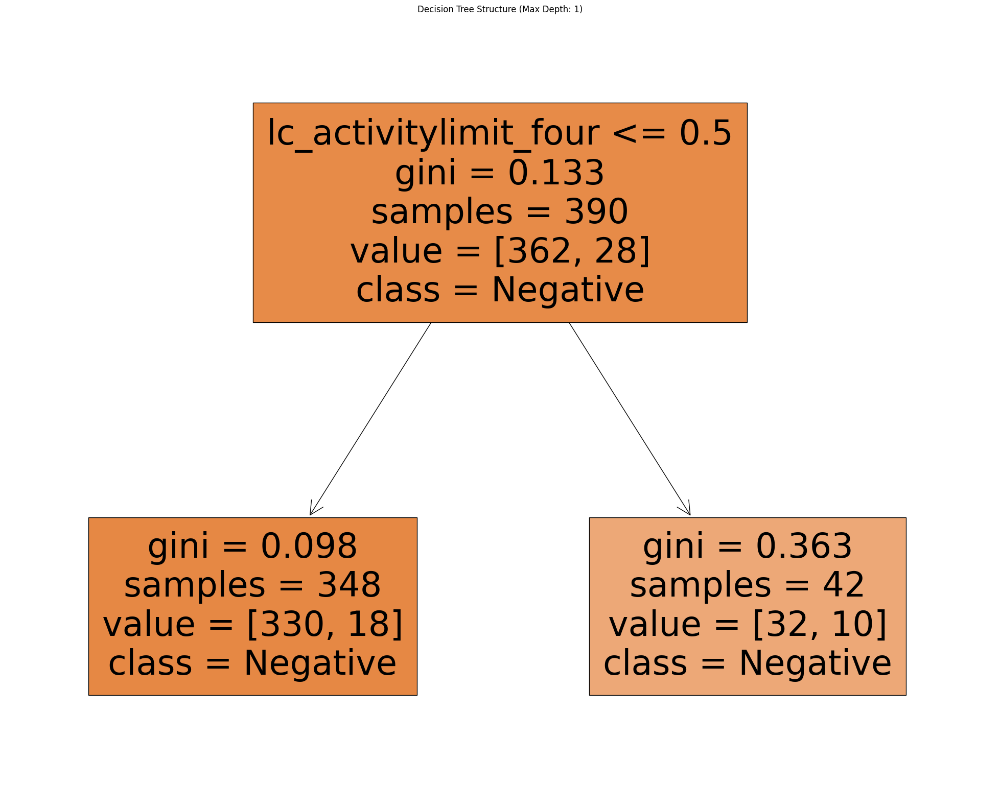

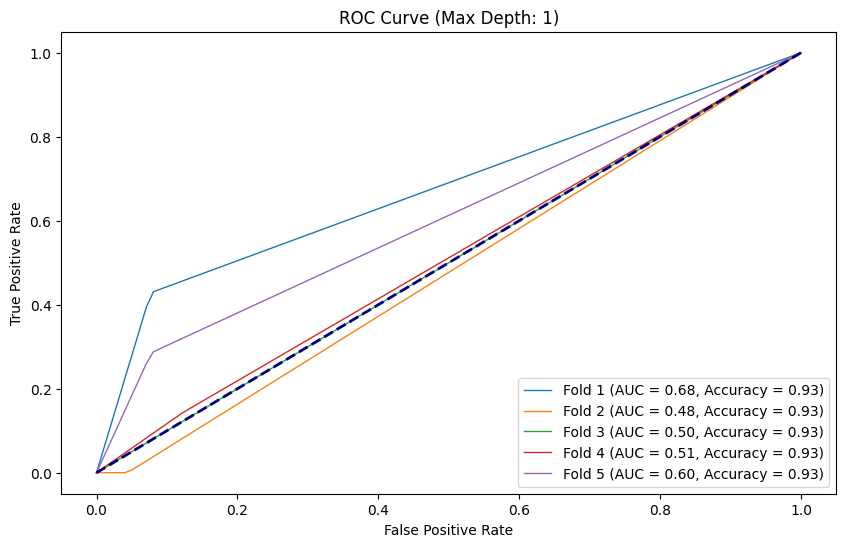

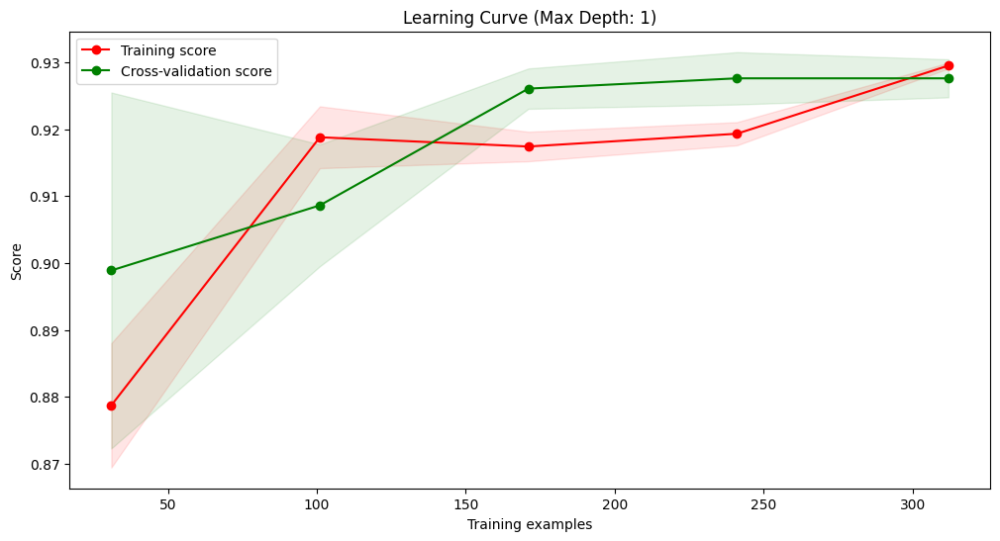

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


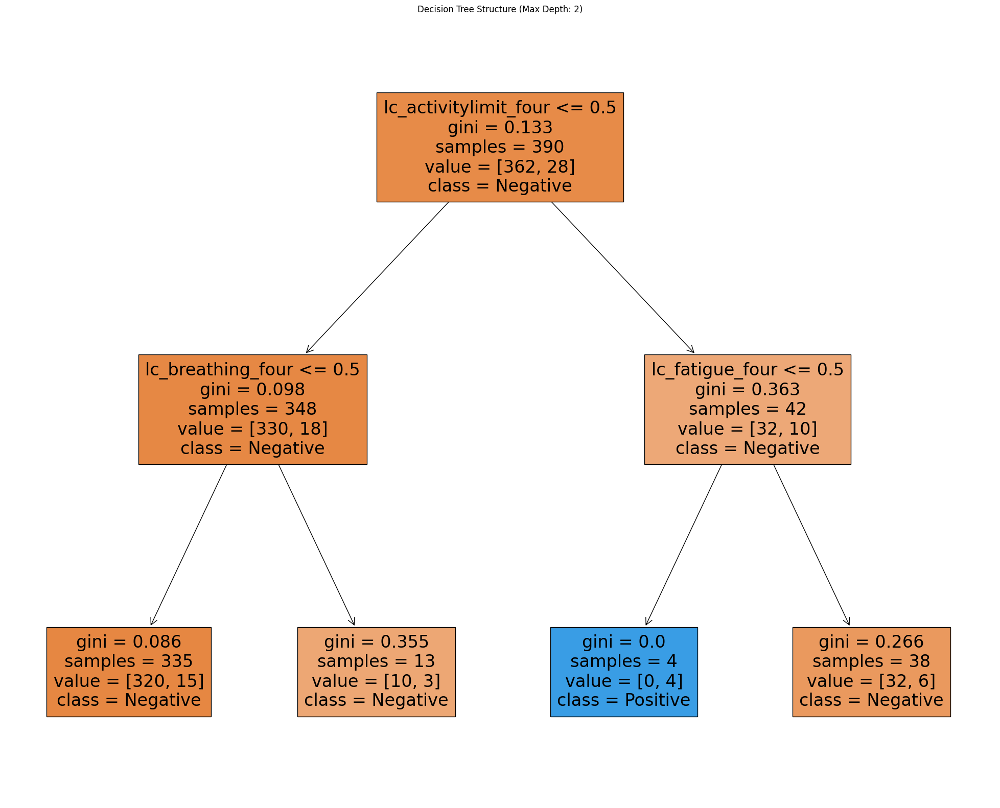

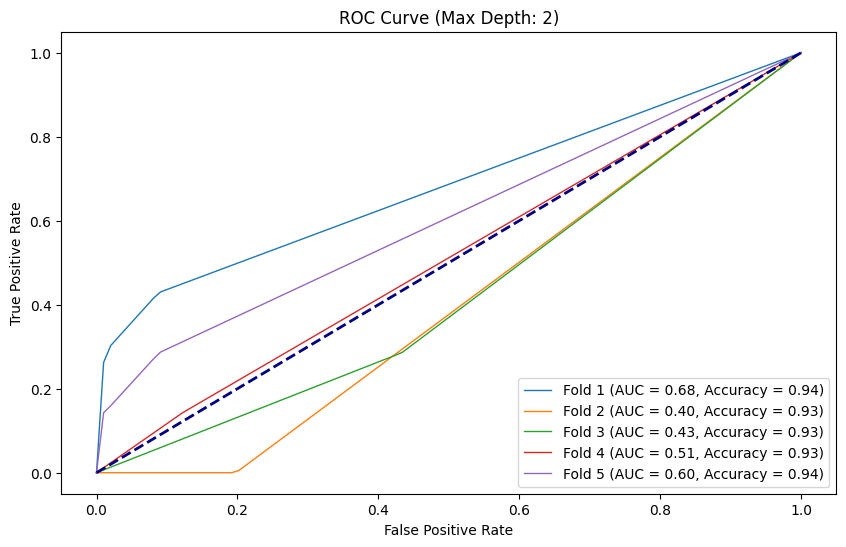

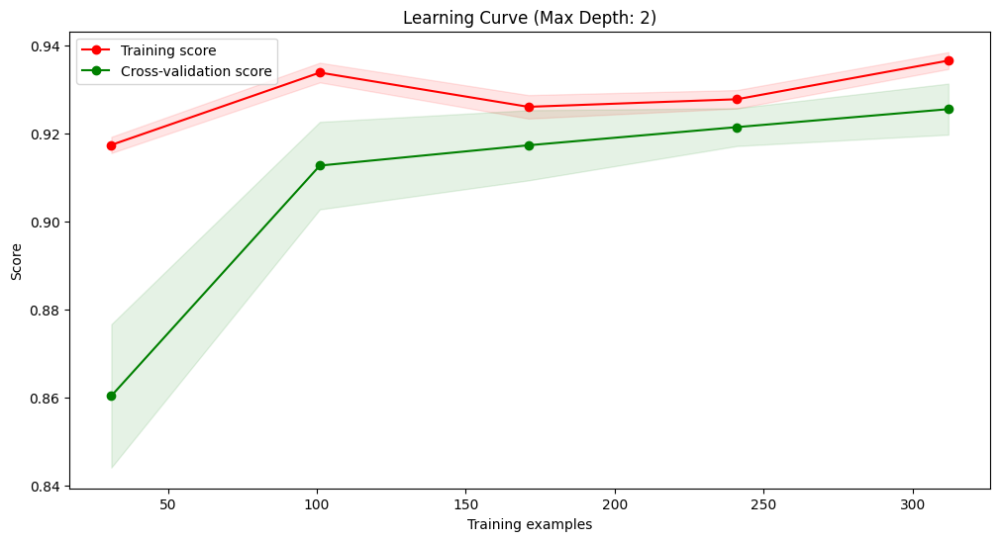

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


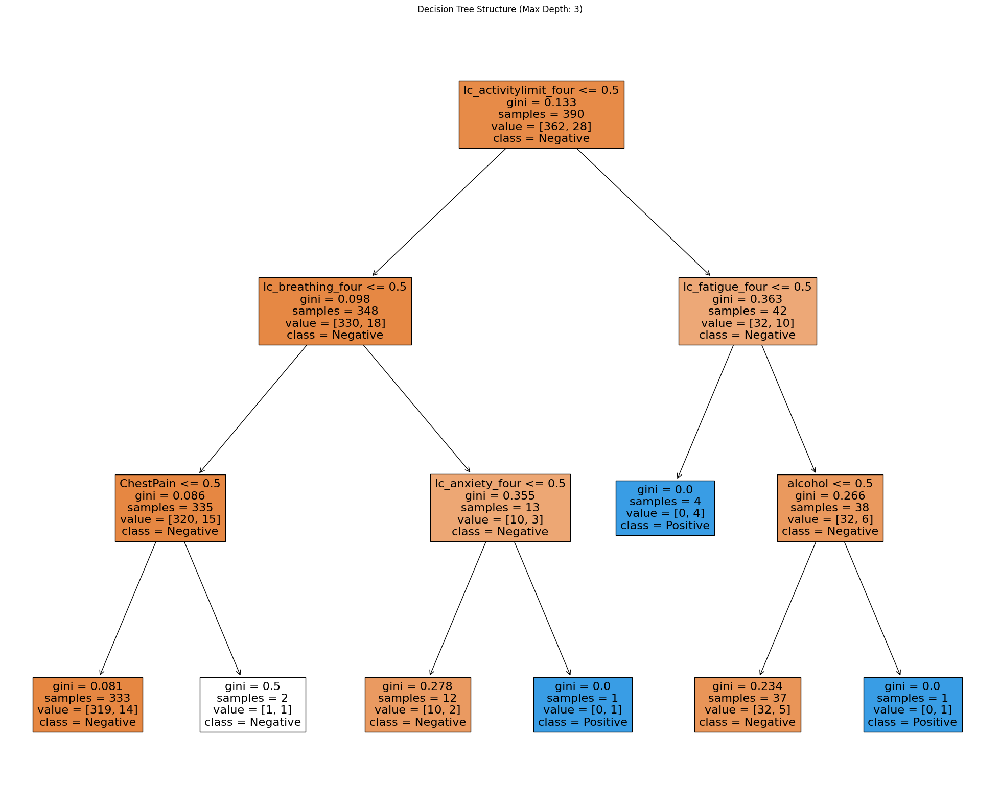

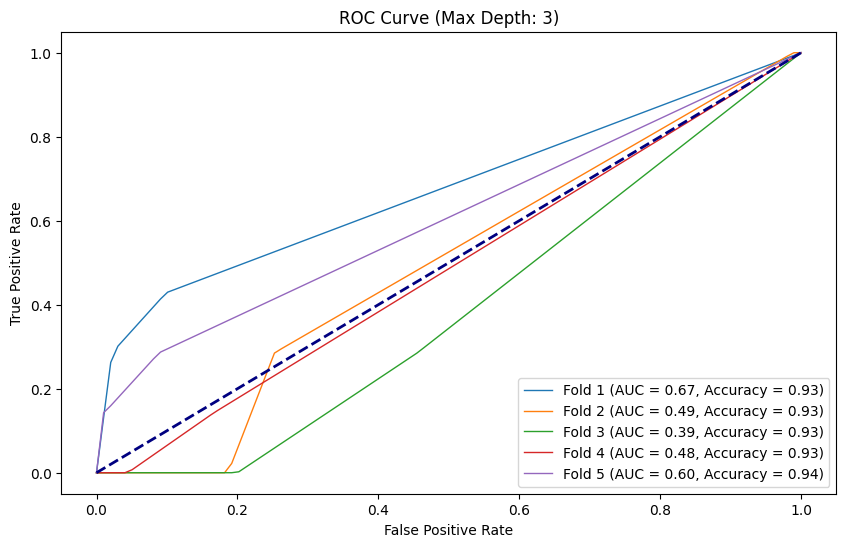

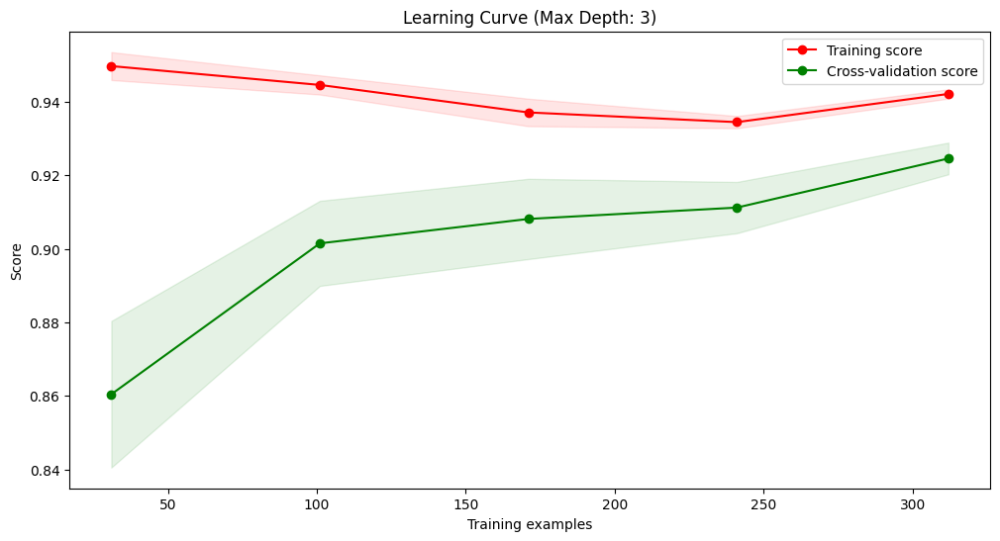

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


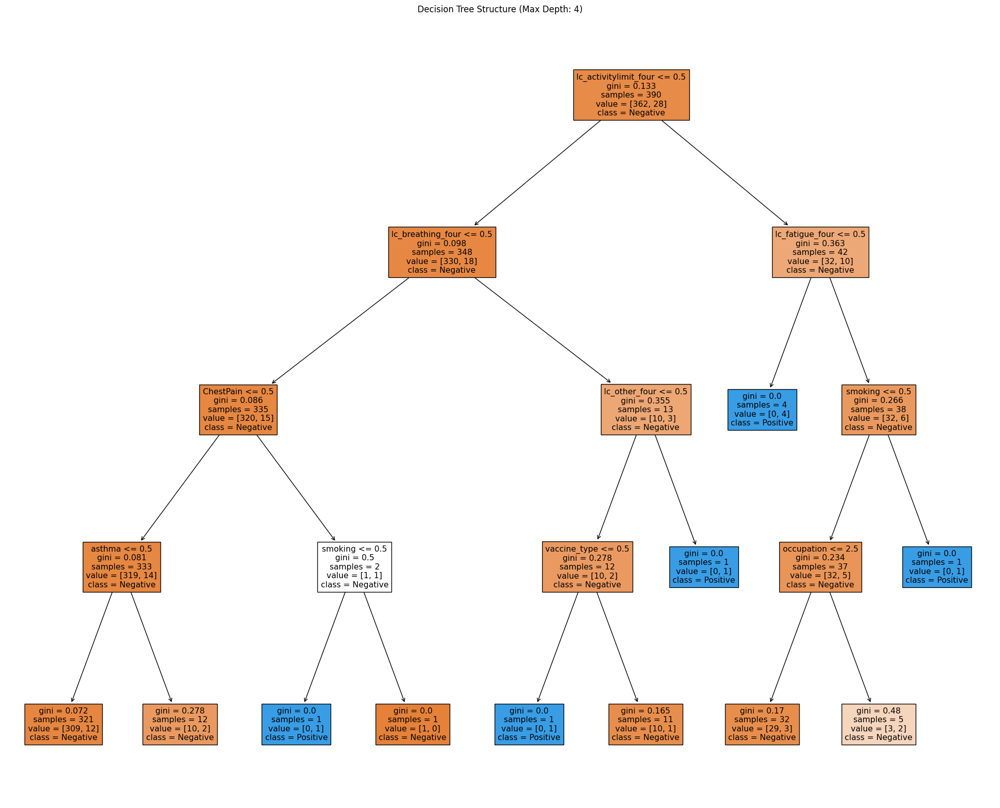

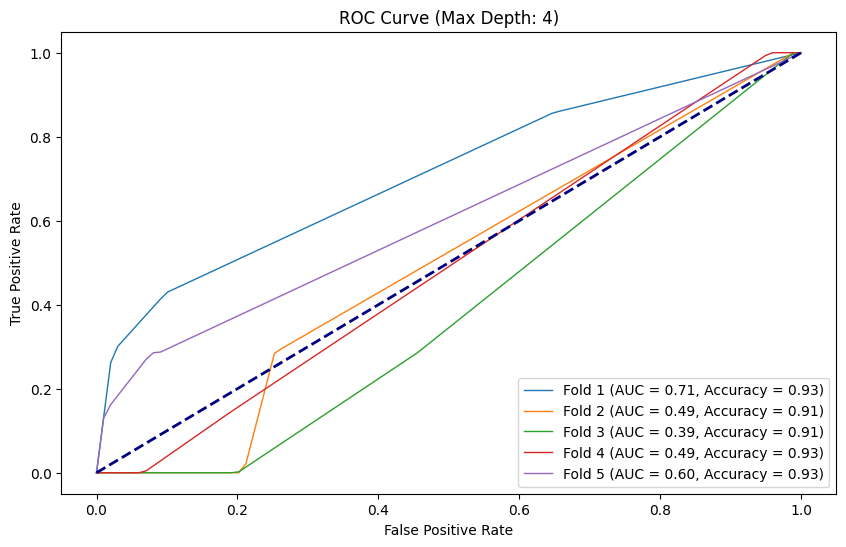

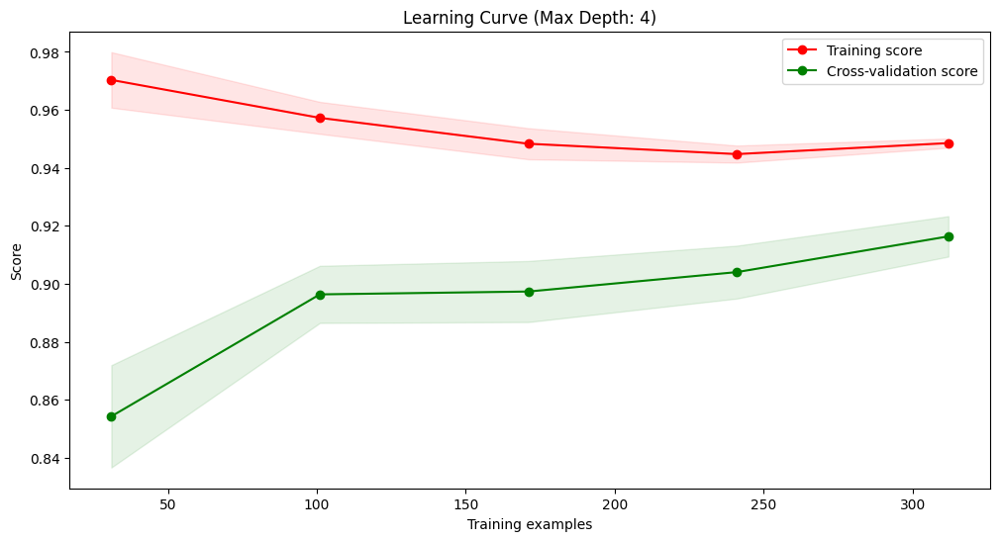

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


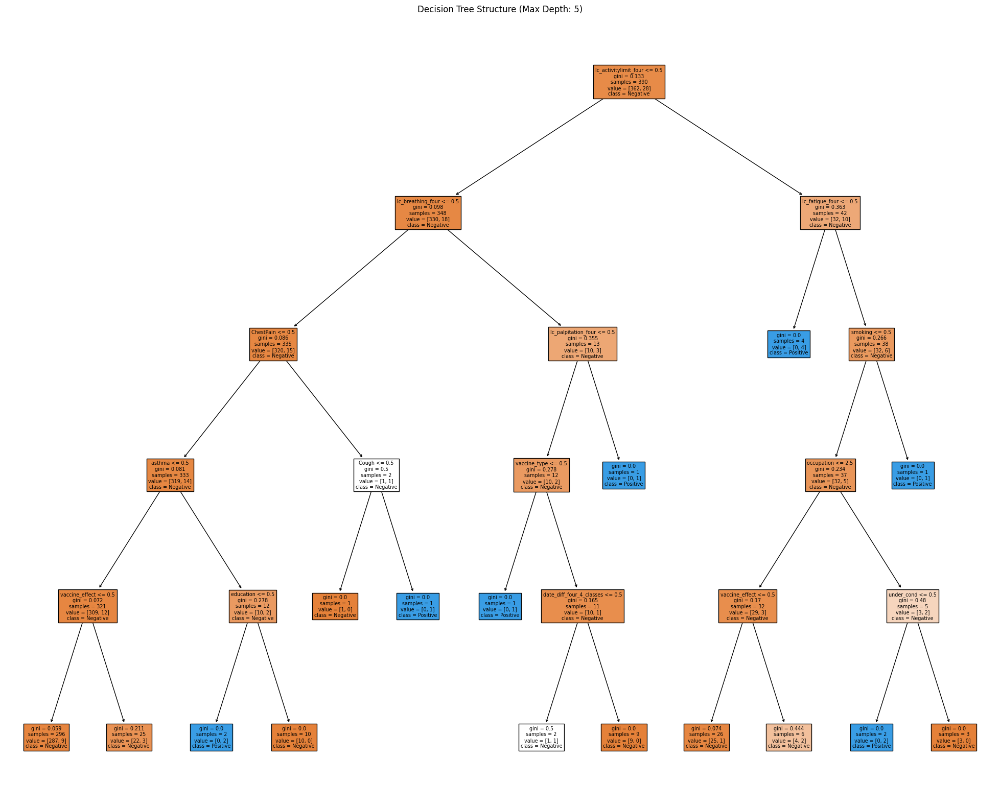

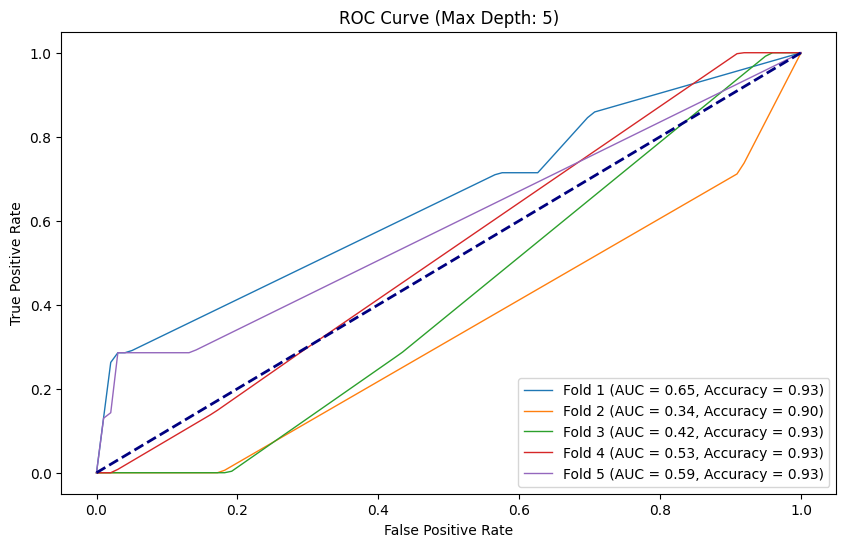

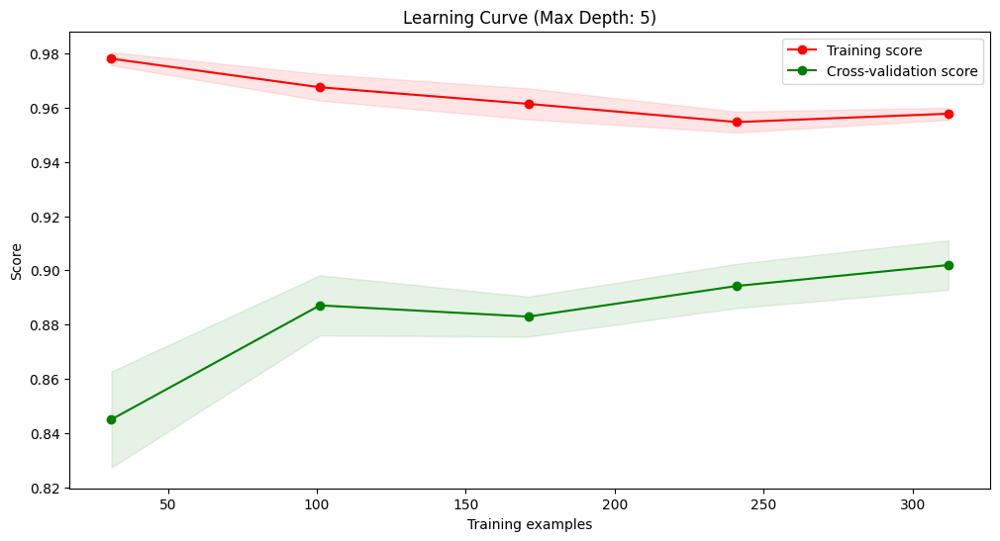

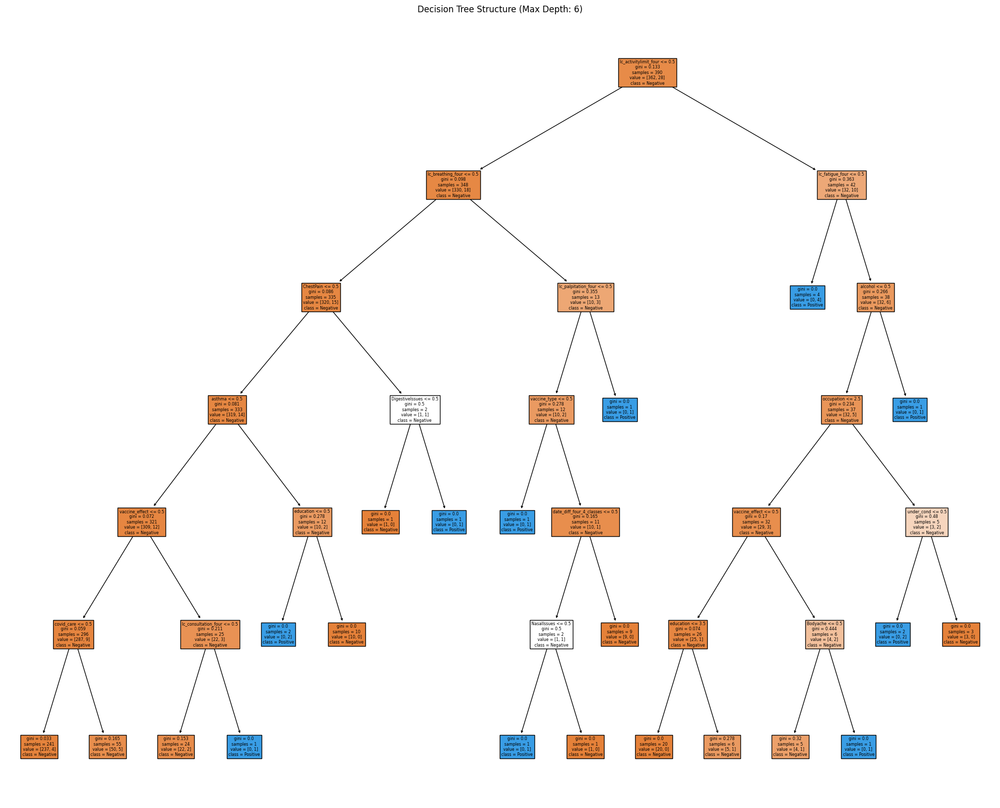

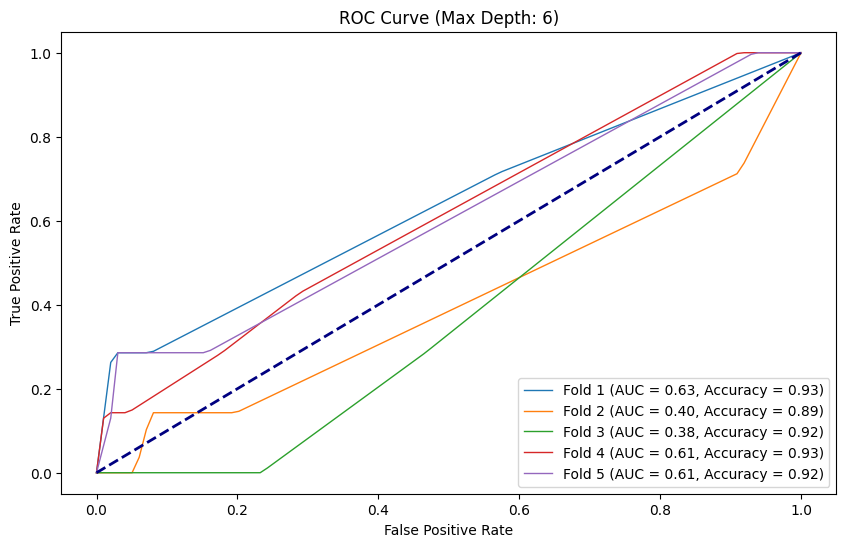

...

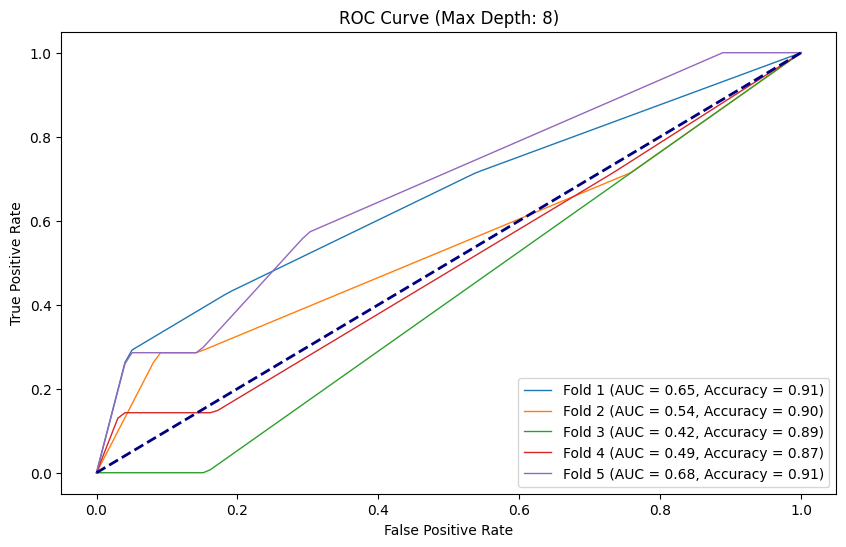

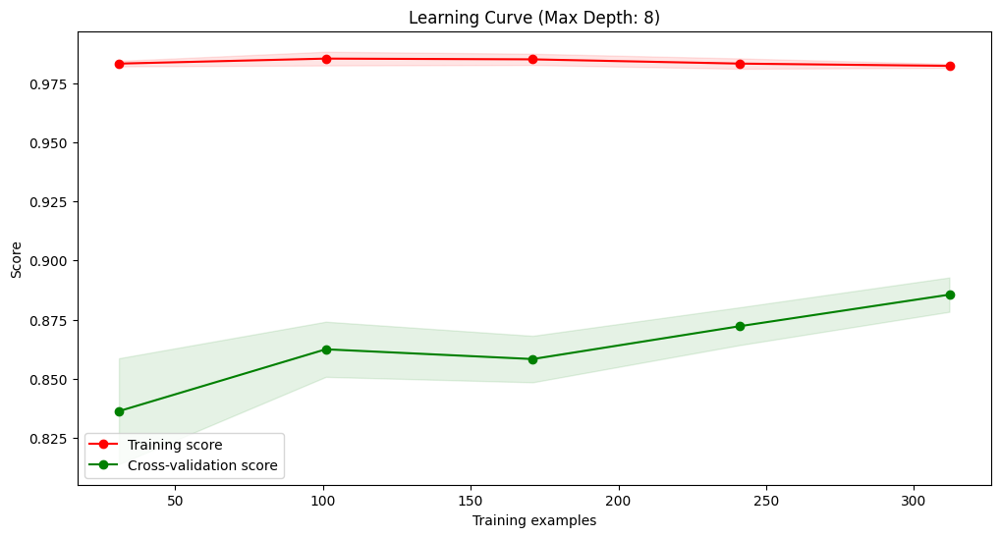

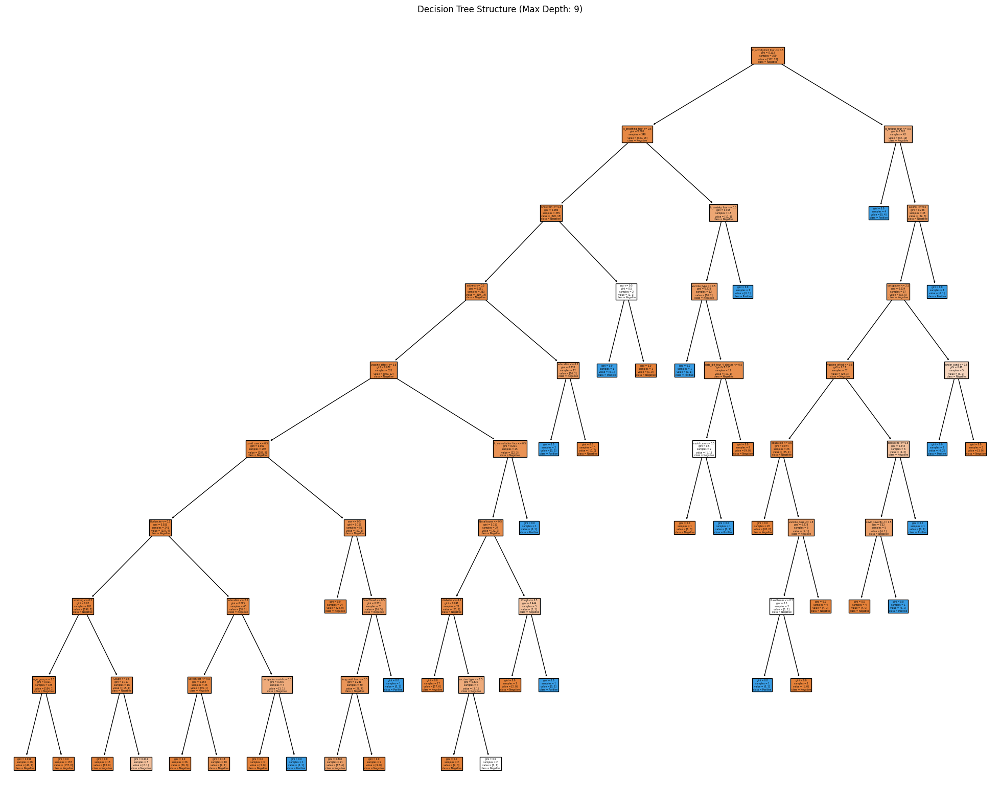

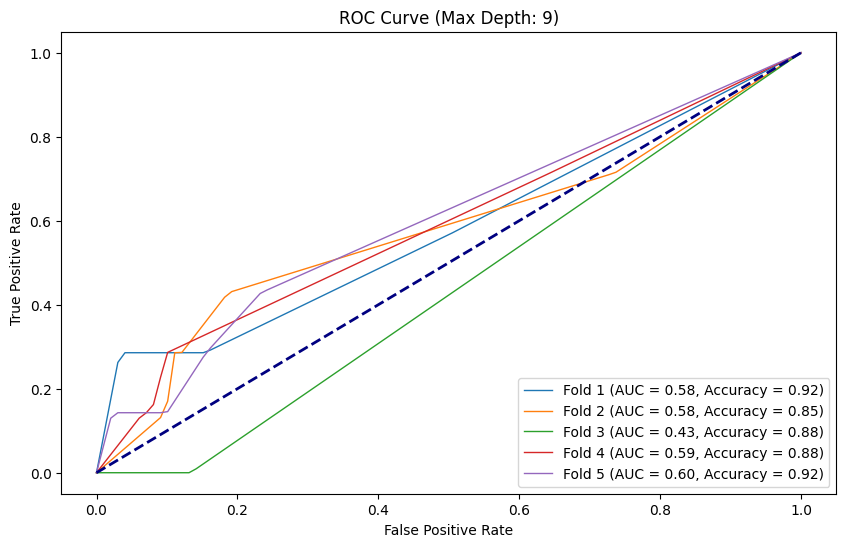

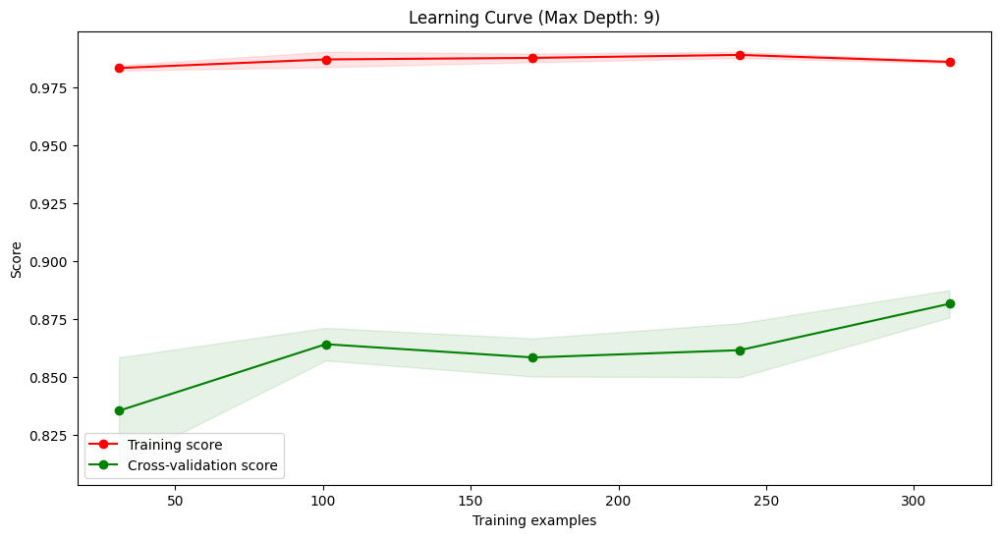

                      Config  Average Accuracy  Average ROC AUC  \
0  DecisionTree; Max Depth=1          0.928130         0.553626   
1  DecisionTree; Max Depth=2          0.932232         0.524422   
2  DecisionTree; Max Depth=3          0.930191         0.528674   
3  DecisionTree; Max Depth=4          0.919924         0.537331   
4  DecisionTree; Max Depth=5          0.922007         0.503680   
5  DecisionTree; Max Depth=6          0.915843         0.524687   
6  DecisionTree; Max Depth=7          0.911719         0.557145   
7  DecisionTree; Max Depth=8          0.893183         0.557499   
8  DecisionTree; Max Depth=9          0.887082         0.555212   

   Average PR AUC  Average Precision  Average Recall  Average F1  \
0        0.276051           0.000000        0.000000    0.000000   
1        0.213268           0.333333        0.085714    0.130000   
2        0.165347           0.300000        0.085714    0.122727   
3        0.156789           0.200000        0.085714    0

In [31]:
X = covidML.drop(columns=["longcovid_six"])
y = covidML["longcovid_six"]

depths = list(range(1, 10))
results_dt = train_and_evaluate_dt(X, y, depths)
print(pd.DataFrame(results_dt))

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


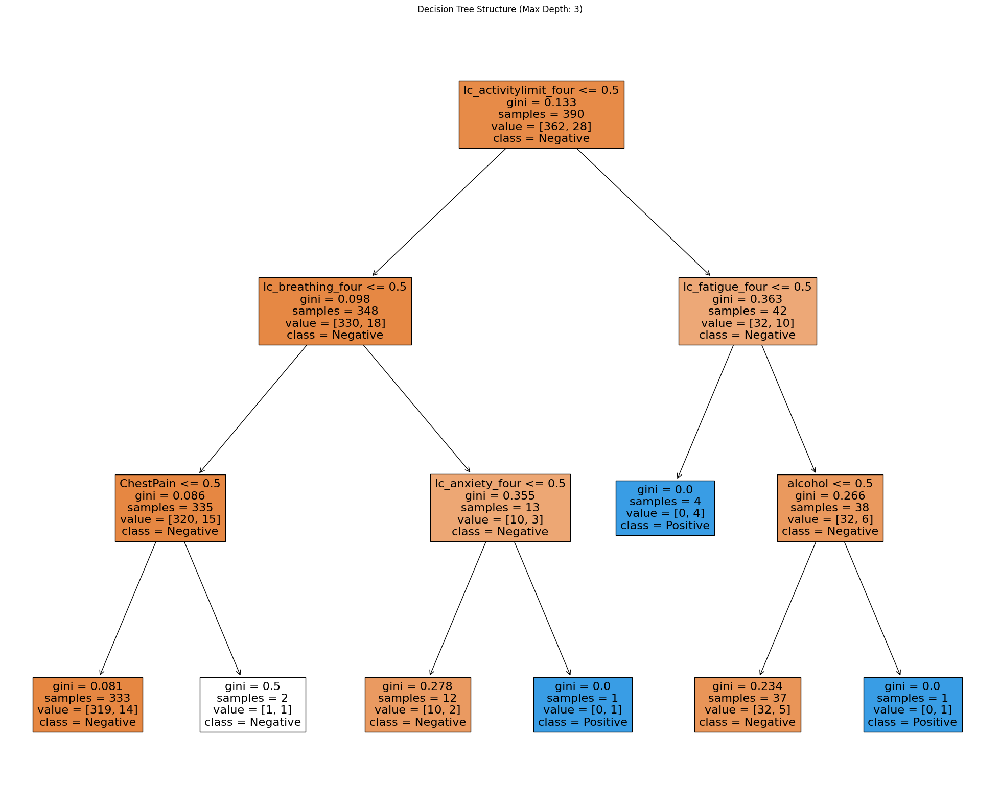

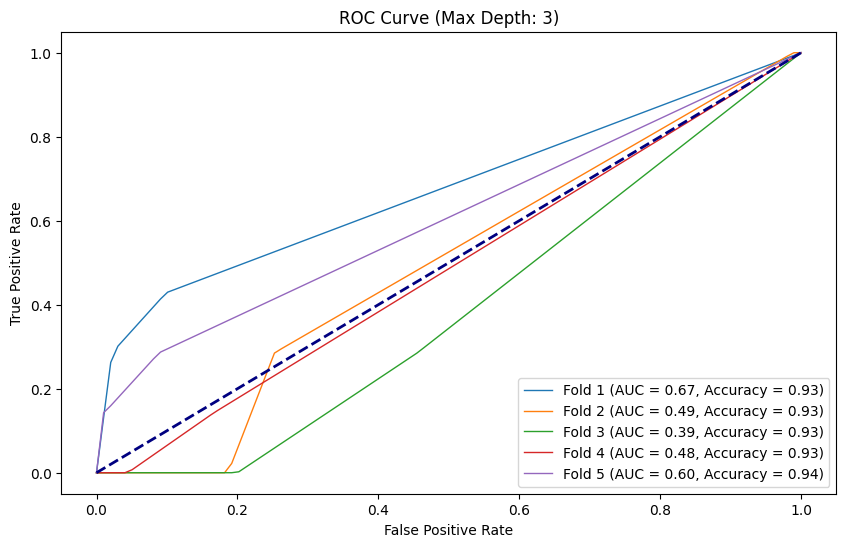

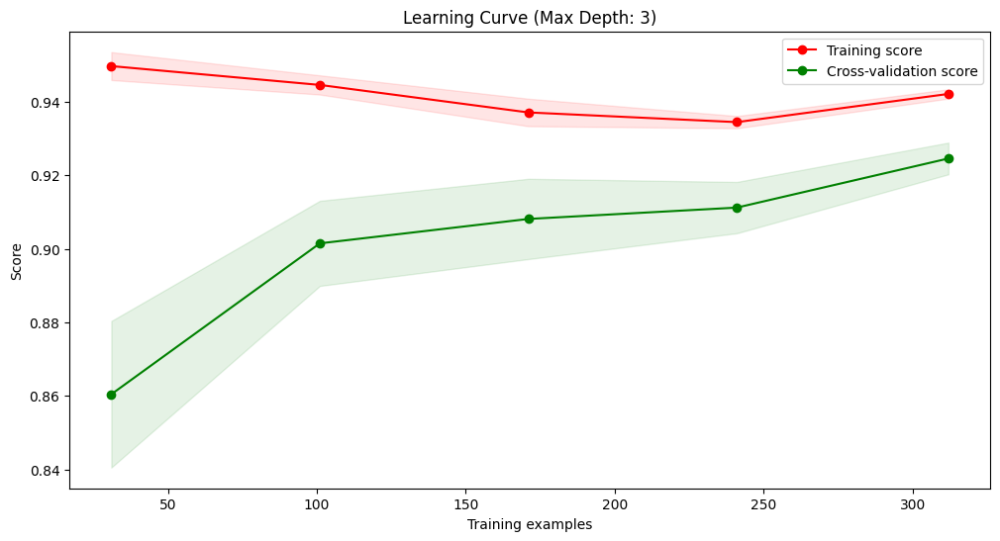

In [46]:

depths = list(range(3,4))
results_dt = train_and_evaluate_dt(X, y, depths)

In [39]:
y.unique().tolist()

[0, 1]

## Logistic Regression

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve

In [23]:
def train_and_evaluate_logistic(X, y, C_values=[1.0]):
    all_results = []
    
    solver_penalty_map = {
        'newton-cg': ['l2'],
        'lbfgs': ['l2'],
        'liblinear': ['l1', 'l2'],
        'sag': ['l2'],
        'saga': ['l1', 'l2']
    }
    
    for C in C_values:
        for solver, penalties in solver_penalty_map.items():
            for penalty in penalties:
                kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

                accuracies = []
                roc_aucs = []
                pr_aucs = []
                precisions = []
                recalls = []
                f1s = []
                specificities = []
                computation_times = []

                tpr_all = []
                fpr_all = np.linspace(0, 1, 100)
                precisions_curve_all = []
                recalls_curve_all = np.linspace(0, 1, 100)

                fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
                fig_cm, ax_cm = plt.subplots(1, 5, figsize=(20, 4))  # Confusion matrices side by side

                for idx, (train_idx, val_idx) in enumerate(kfold.split(X, y)):
                    start_time = time.time()

                    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
                    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

                    logreg = LogisticRegression(C=C, penalty=penalty, solver=solver, max_iter=10000, random_state=0)
                    logreg.fit(X_train, y_train)

                    y_pred = logreg.predict(X_val)
                    y_pred_prob = logreg.predict_proba(X_val)[:, 1]

                    # Compute metrics
                    accuracy = accuracy_score(y_val, y_pred)
                    precision = precision_score(y_val, y_pred)
                    recall = recall_score(y_val, y_pred)
                    f1 = f1_score(y_val, y_pred)
                    roc_auc = roc_auc_score(y_val, y_pred_prob)
                    precision_curve, recall_curve, _ = precision_recall_curve(y_val, y_pred_prob)
                    pr_auc = auc(recall_curve, precision_curve)
                    tn, fp, fn, tp = confusion_matrix(y_val, y_pred).ravel()
                    specificity = tn / (tn + fp)

                    end_time = time.time()
                    elapsed_time = end_time - start_time  # Compute time in seconds

                    # Append metrics for later averaging
                    accuracies.append(accuracy)
                    roc_aucs.append(roc_auc)
                    pr_aucs.append(pr_auc)
                    precisions.append(precision)
                    recalls.append(recall)
                    f1s.append(f1)
                    specificities.append(specificity)
                    computation_times.append(elapsed_time)

                    # Interpolate tpr to have the same length as fpr_all
                    fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
                    interpolated_tpr = np.interp(fpr_all, fpr, tpr)
                    interpolated_tpr[0] = 0.0  # Ensure starts with 0
                    tpr_all.append(interpolated_tpr)

                    interpolated_precisions = np.interp(recalls_curve_all, recall_curve[::-1], precision_curve[::-1])
                    precisions_curve_all.append(interpolated_precisions)
                    
                    
                    print(C,penalty, solver)

                    # ROC Curve
                    ax1.plot(fpr, tpr, lw=1, label=f'Fold {idx + 1} (AUC = {roc_aucs[idx]:.2f}, Accuracy = {accuracies[idx]:.2f})')
                    ax1.set_xlabel('False Positive Rate')
                    ax1.set_ylabel('True Positive Rate')
                    ax1.set_title(f'ROC Curve')
                    ax1.legend(loc='lower right')

                    # Precision-Recall curve
                    ax2.plot(recall_curve, precision_curve, lw=1, label=f'Fold {idx + 1} (PR AUC = {pr_aucs[idx]:.2f})')
                    ax2.set_xlabel('Recall')
                    ax2.set_ylabel('Precision')
                    ax2.set_title(f'Precision-Recall Curve')
                    ax2.legend(loc='lower right')

                    # Confusion matrix for current fold
                    cm = confusion_matrix(y_val, y_pred)
                    ax_cm[idx].matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
                    for i in range(cm.shape[0]):
                        for j in range(cm.shape[1]):
                            ax_cm[idx].text(x=j, y=i, s=cm[i, j], va='center', ha='center')
                    ax_cm[idx].set_title(f'Fold {idx+1}')
                    ax_cm[idx].set_xlabel('Predicted label')
                    ax_cm[idx].set_ylabel('True label')

                # Calibration plot
                prob_true, prob_pred = calibration_curve(y_val, y_pred_prob, n_bins=10)
                ax3.plot([0, 1], [0, 1], linestyle='--', label='Perfectly calibrated')
                ax3.plot(prob_pred, prob_true, marker='.')
                ax3.set_title('Calibration Plot')
                ax3.set_xlabel('Mean Predicted Probability')
                ax3.set_ylabel('Fraction of Positives')
                ax3.legend()

                plt.tight_layout()
                plt.show()

                # Append results for this configuration
                all_results.append({
                    'Config': f"LogReg; C={C}; Penalty={penalty}; Solver={solver}",
                    'Average Accuracy': np.mean(accuracies),
                    'Average ROC AUC': np.mean(roc_aucs),
                    'Average PR AUC': np.mean(pr_aucs),
                    'Average Precision': np.mean(precisions),
                    'Average Recall': np.mean(recalls),
                    'Average F1': np.mean(f1s),
                    'Average Specificity': np.mean(specificities),
                    'Total Computation Time': np.sum(computation_times)
                })

    return all_results

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.001 l2 newton-cg
0.001 l2 newton-cg
0.001 l2 newton-cg
0.001 l2 newton-cg
0.001 l2 newton-cg


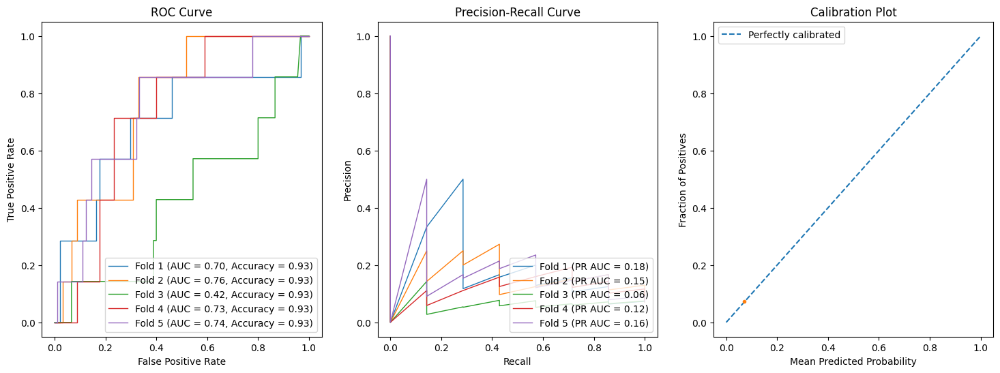

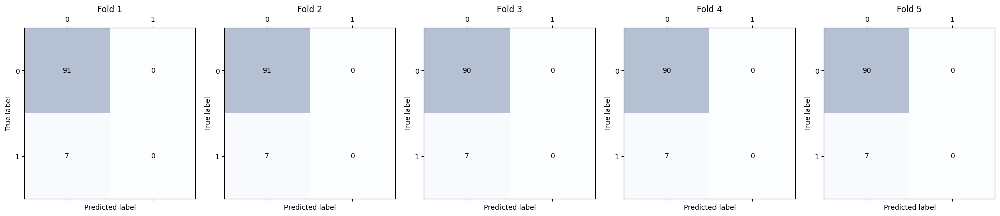

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.001 l2 lbfgs
0.001 l2 lbfgs
0.001 l2 lbfgs
0.001 l2 lbfgs
0.001 l2 lbfgs


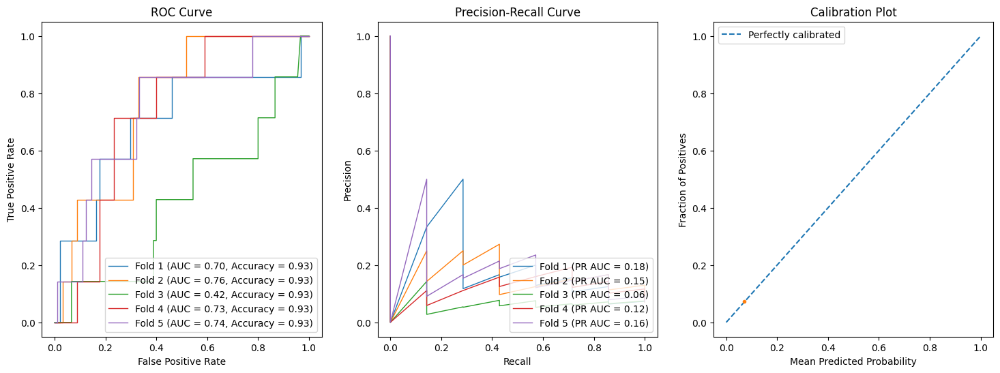

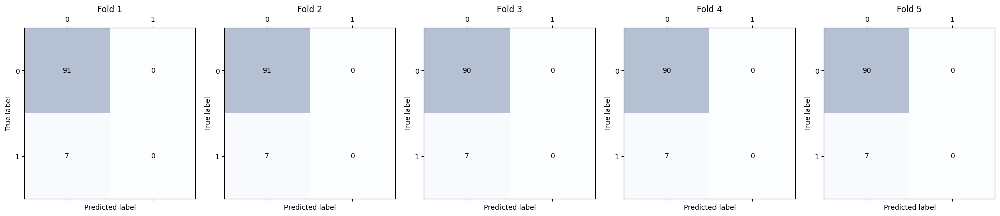

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.001 l1 liblinear
0.001 l1 liblinear
0.001 l1 liblinear
0.001 l1 liblinear
0.001 l1 liblinear


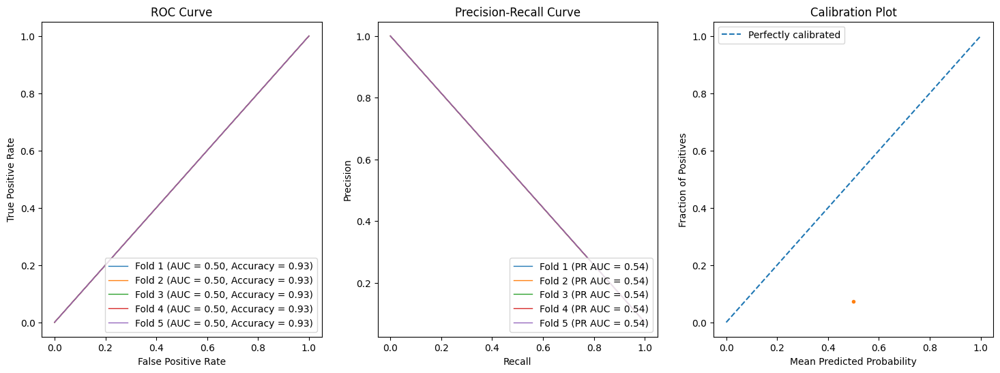

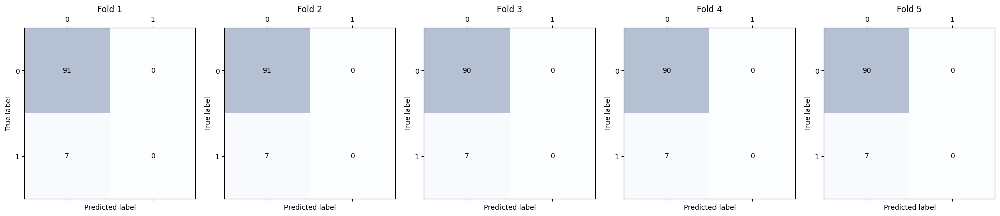

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.001 l2 liblinear
0.001 l2 liblinear
0.001 l2 liblinear
0.001 l2 liblinear
0.001 l2 liblinear


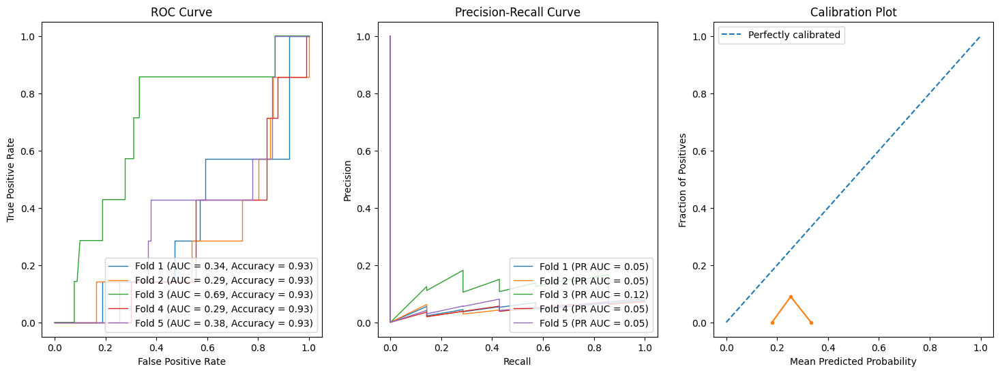

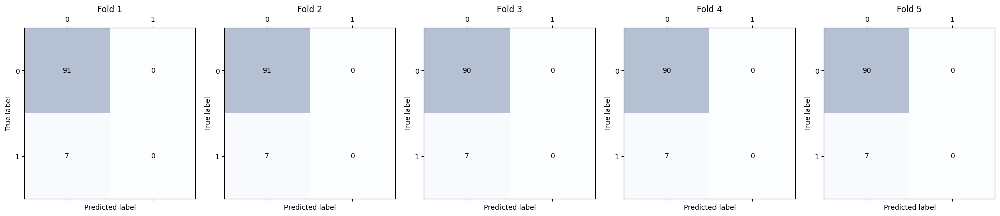

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.001 l2 sag
0.001 l2 sag
0.001 l2 sag
0.001 l2 sag
0.001 l2 sag


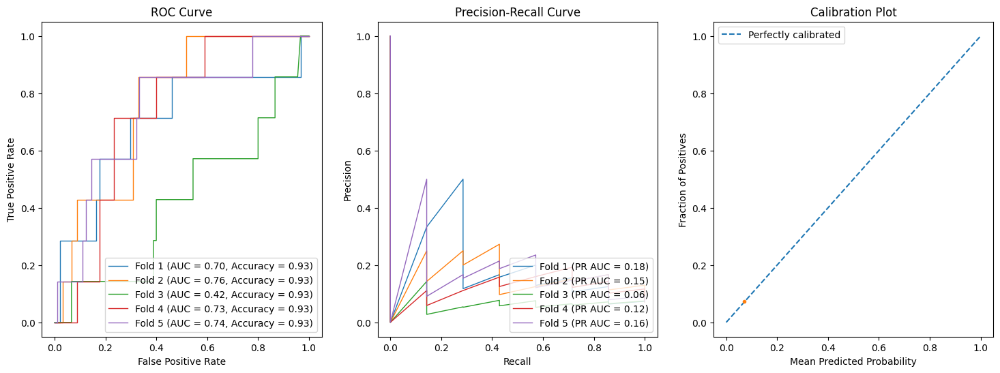

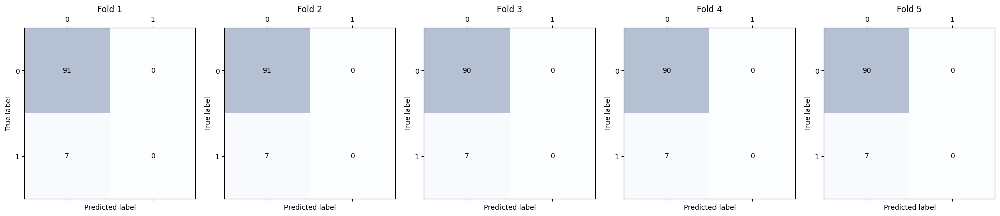

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.001 l1 saga
0.001 l1 saga
0.001 l1 saga
0.001 l1 saga
0.001 l1 saga


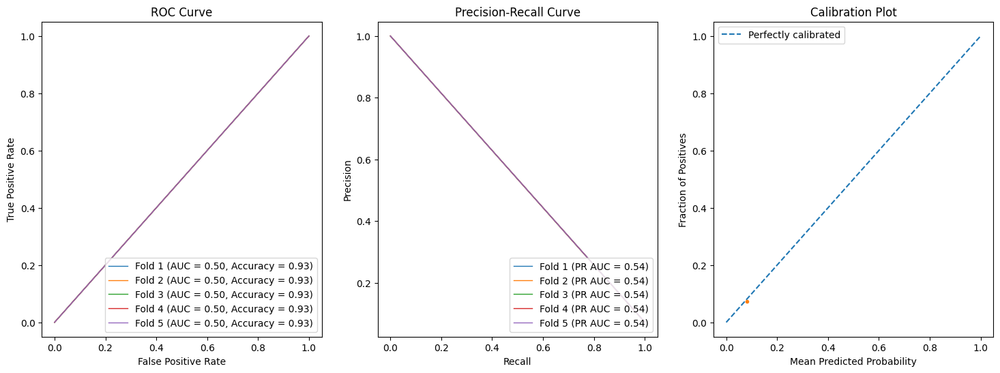

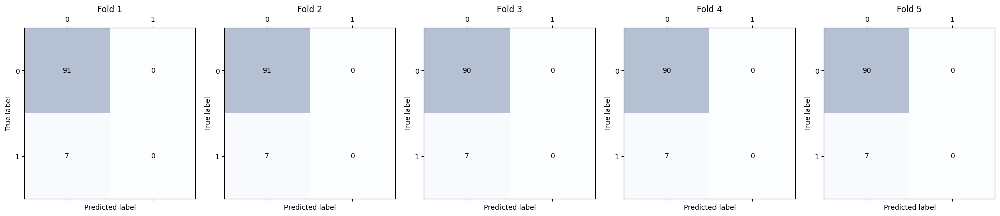

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.001 l2 saga
0.001 l2 saga
0.001 l2 saga
0.001 l2 saga
0.001 l2 saga


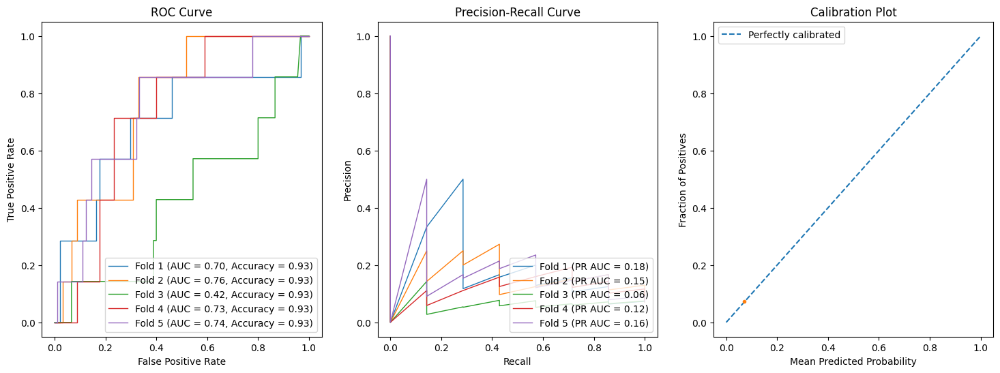

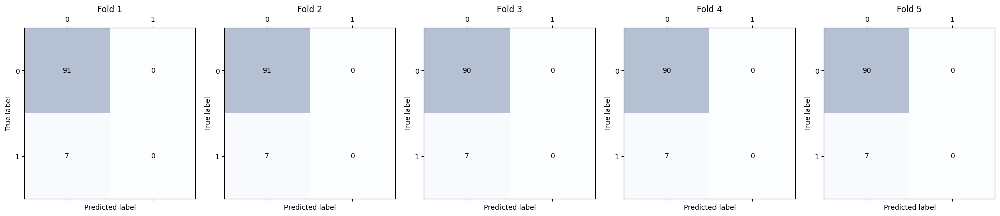

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.01 l2 newton-cg
0.01 l2 newton-cg
0.01 l2 newton-cg
0.01 l2 newton-cg
0.01 l2 newton-cg


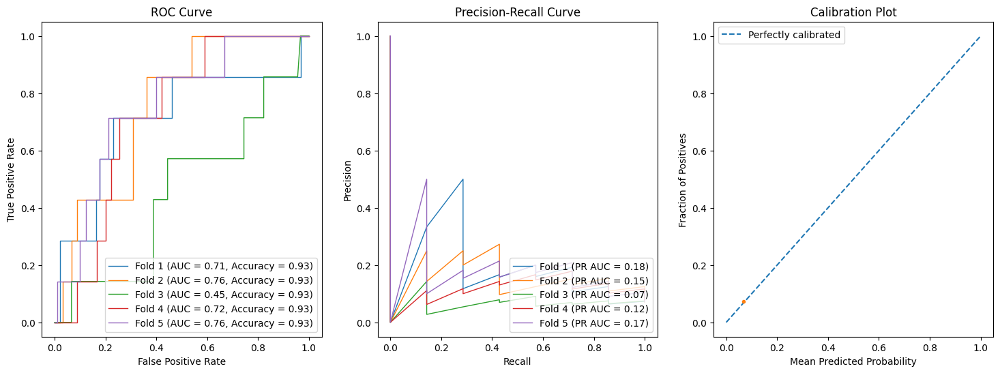

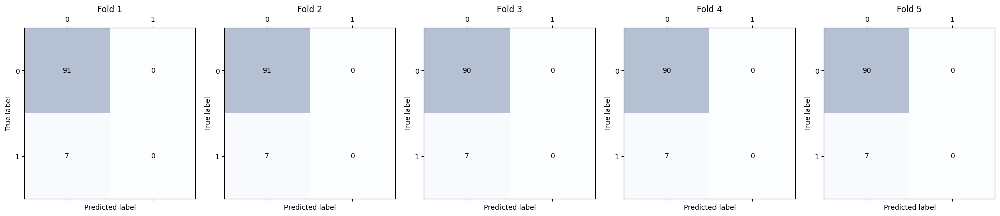

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.01 l2 lbfgs
0.01 l2 lbfgs
0.01 l2 lbfgs
0.01 l2 lbfgs
0.01 l2 lbfgs


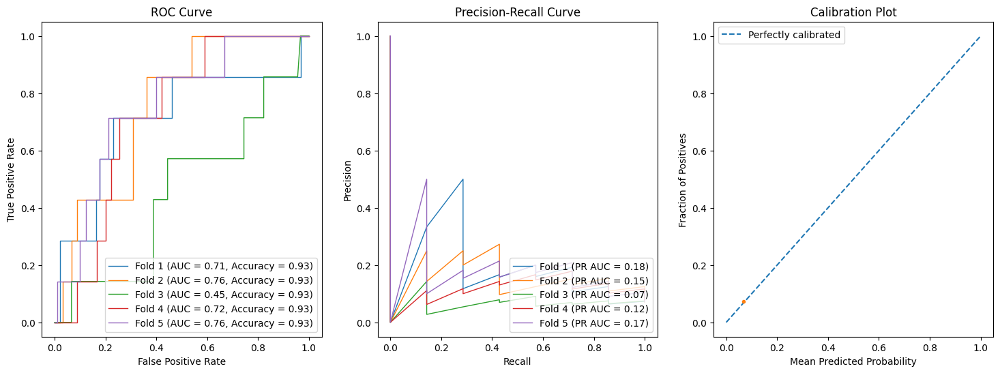

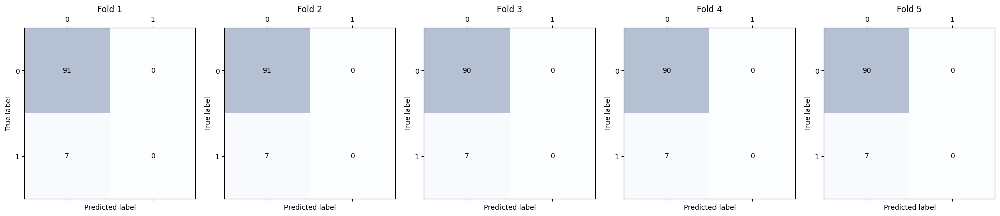

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.01 l1 liblinear
0.01 l1 liblinear
0.01 l1 liblinear
0.01 l1 liblinear
0.01 l1 liblinear


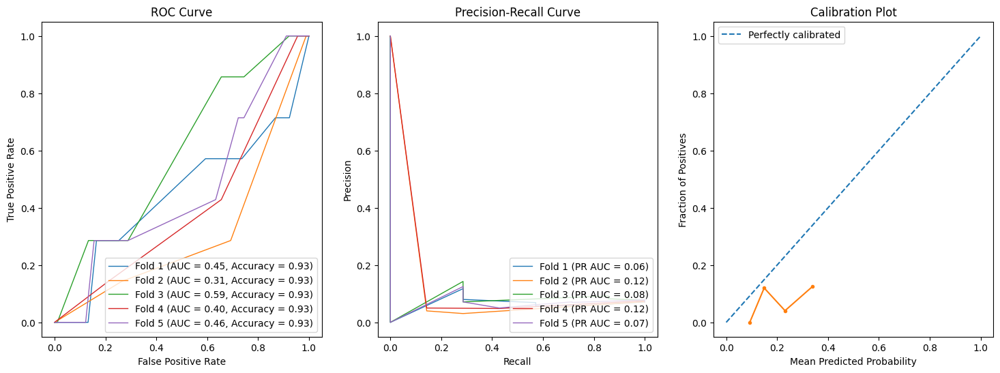

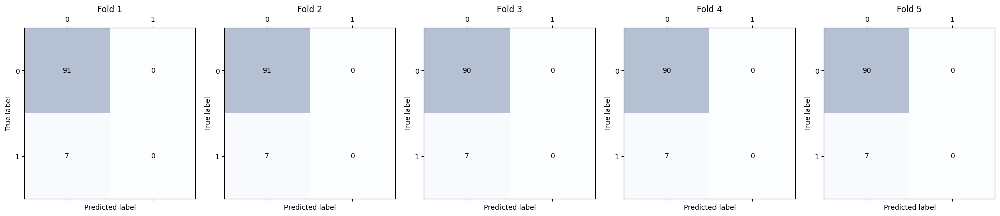

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.01 l2 liblinear
0.01 l2 liblinear
0.01 l2 liblinear
0.01 l2 liblinear
0.01 l2 liblinear


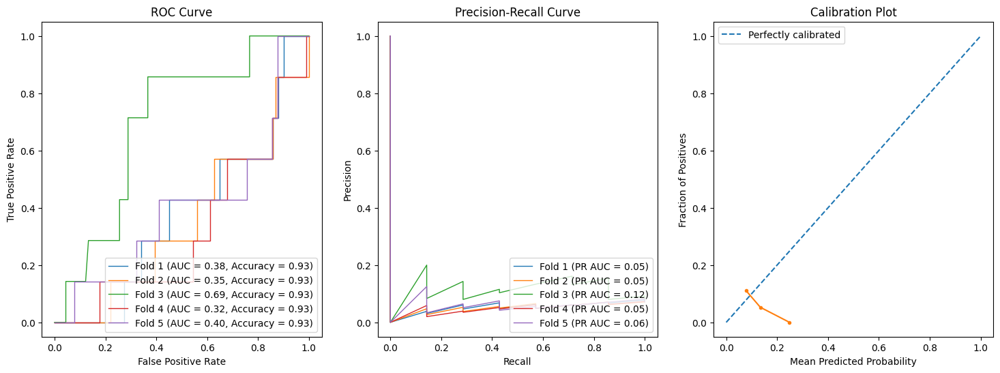

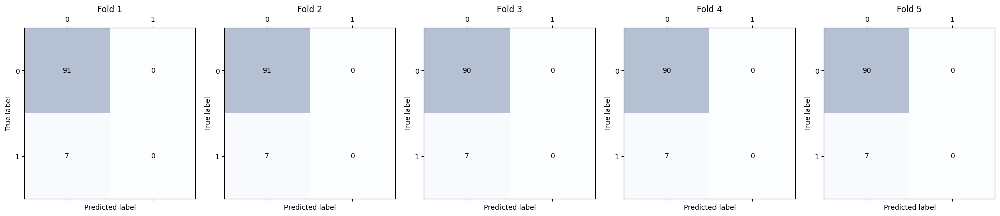

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.01 l2 sag
0.01 l2 sag
0.01 l2 sag
0.01 l2 sag
0.01 l2 sag


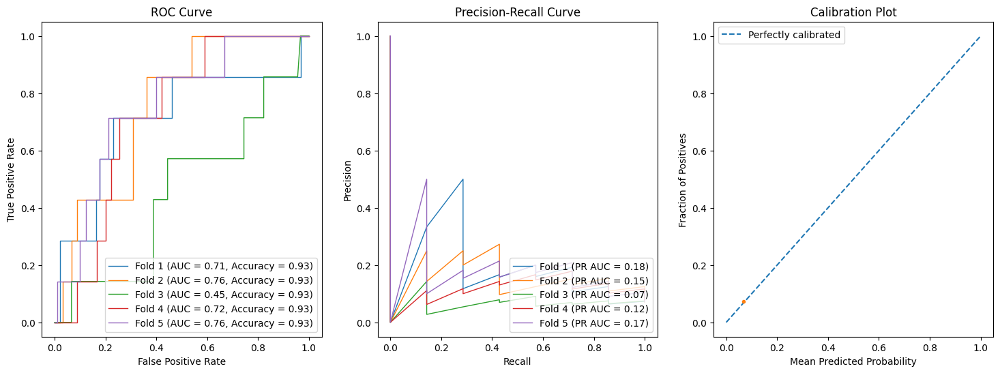

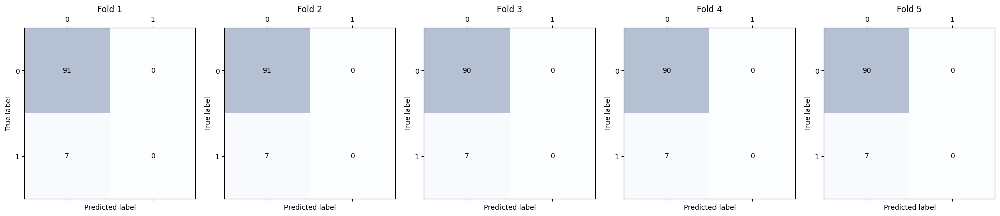

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.01 l1 saga
0.01 l1 saga
0.01 l1 saga
0.01 l1 saga
0.01 l1 saga


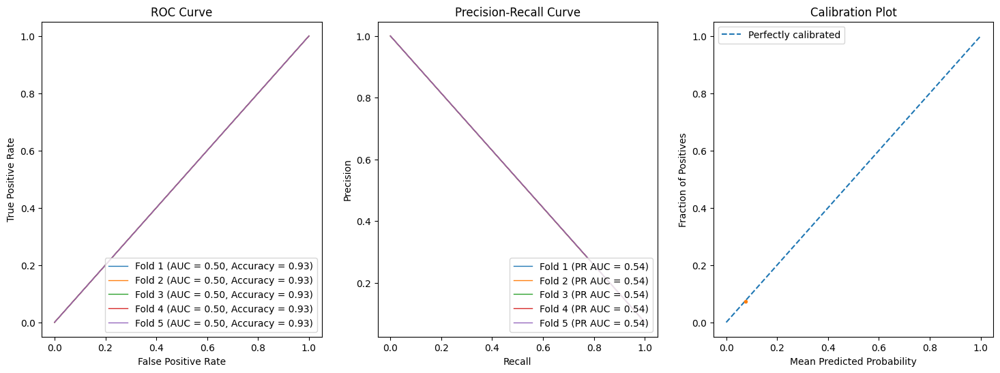

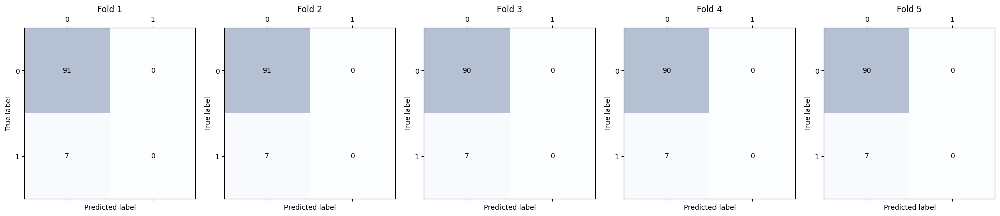

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.01 l2 saga
0.01 l2 saga
0.01 l2 saga
0.01 l2 saga
0.01 l2 saga


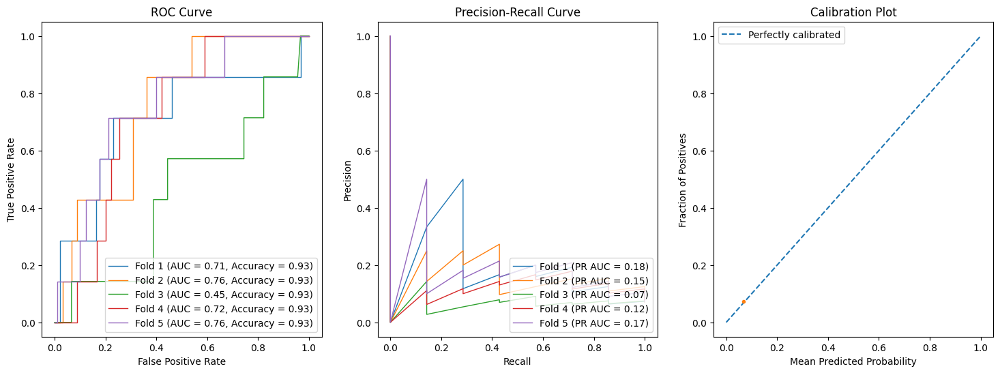

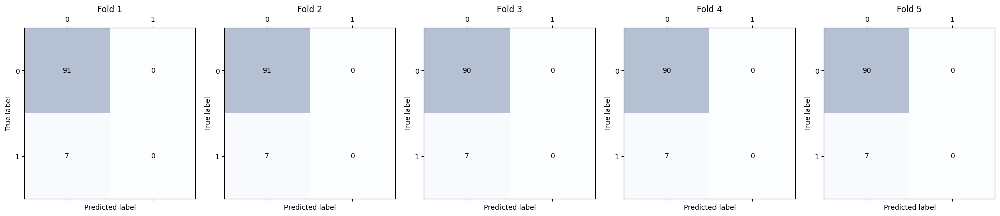

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.1 l2 newton-cg
0.1 l2 newton-cg
0.1 l2 newton-cg
0.1 l2 newton-cg
0.1 l2 newton-cg


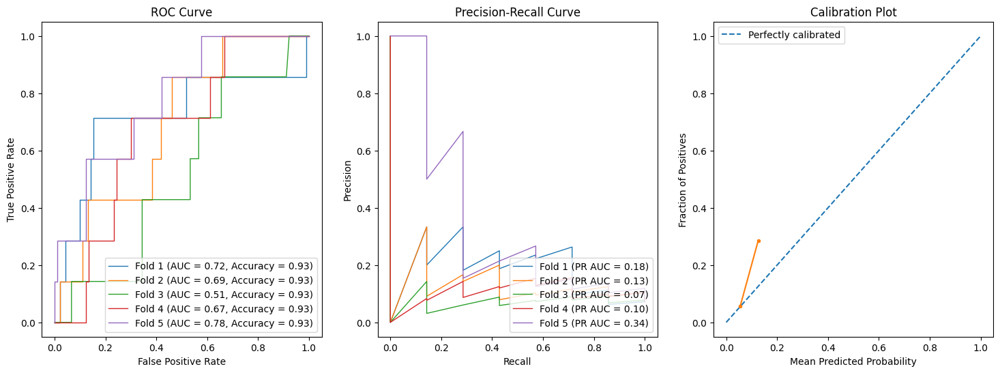

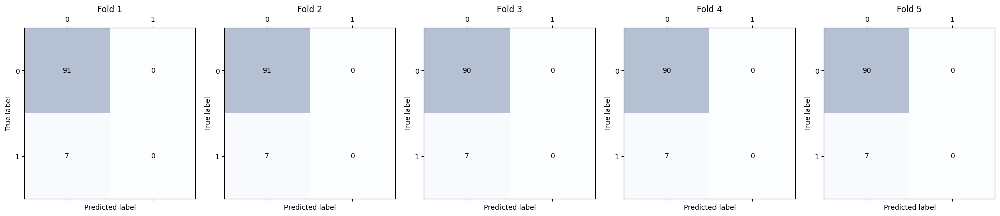

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.1 l2 lbfgs
0.1 l2 lbfgs
0.1 l2 lbfgs
0.1 l2 lbfgs
0.1 l2 lbfgs


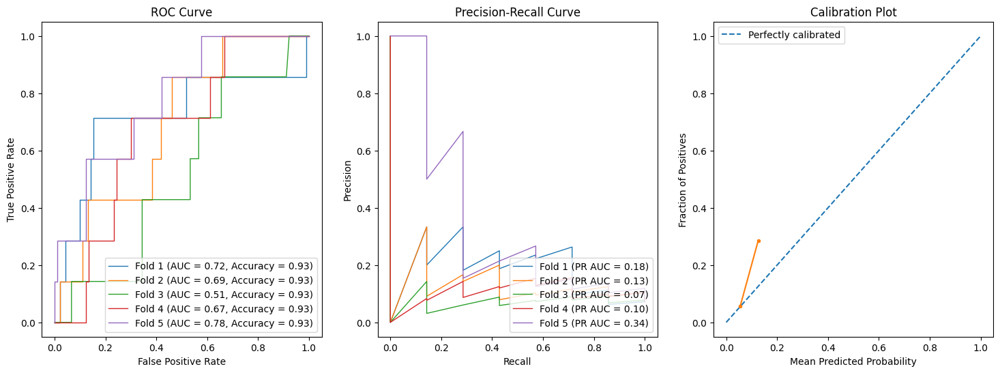

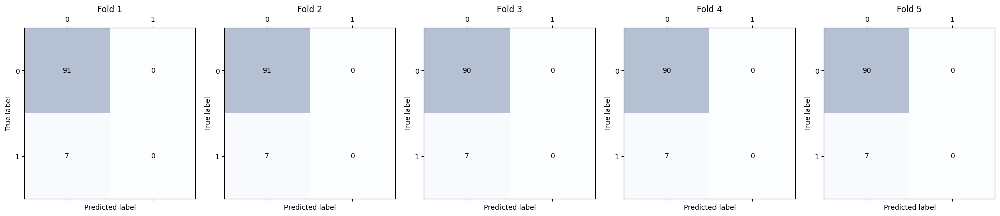

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.1 l1 liblinear
0.1 l1 liblinear
0.1 l1 liblinear
0.1 l1 liblinear
0.1 l1 liblinear


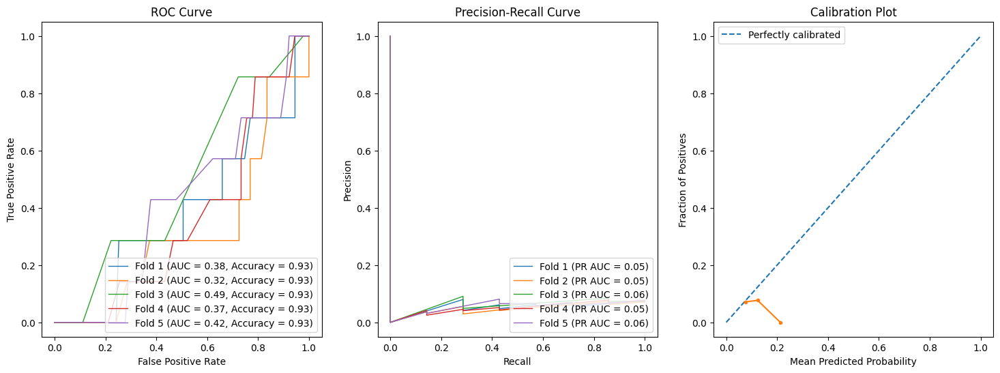

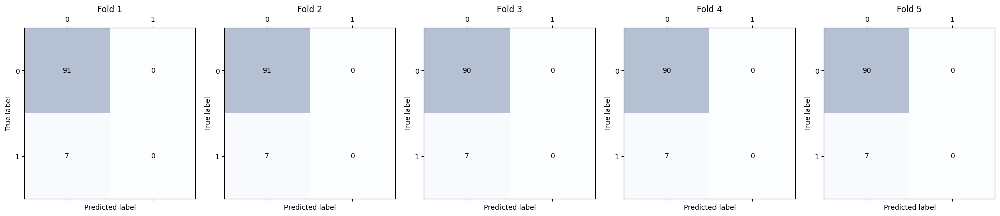

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.1 l2 liblinear
0.1 l2 liblinear
0.1 l2 liblinear
0.1 l2 liblinear
0.1 l2 liblinear


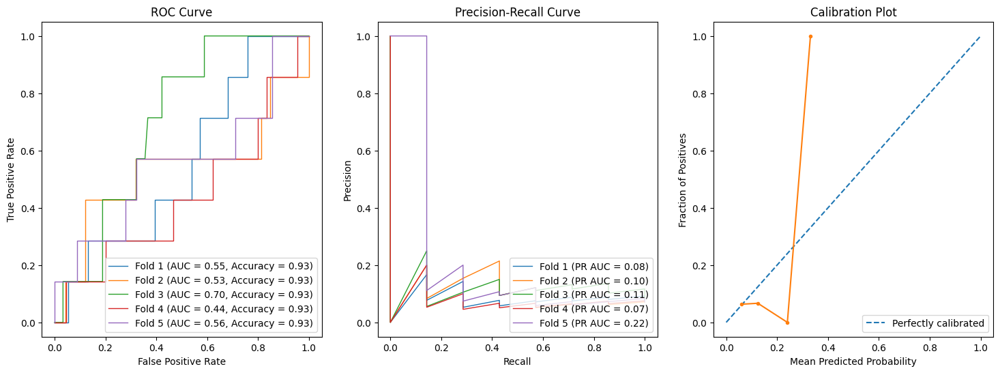

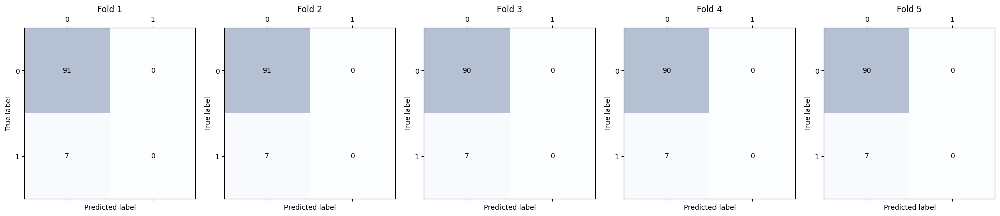

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.1 l2 sag
0.1 l2 sag
0.1 l2 sag
0.1 l2 sag
0.1 l2 sag


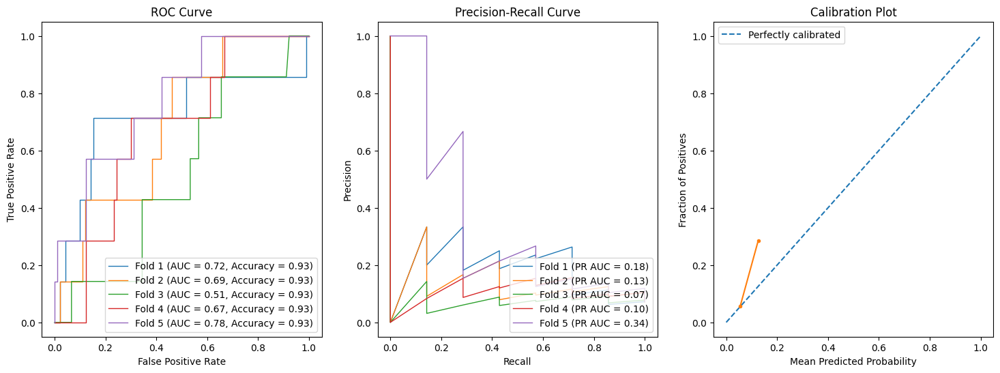

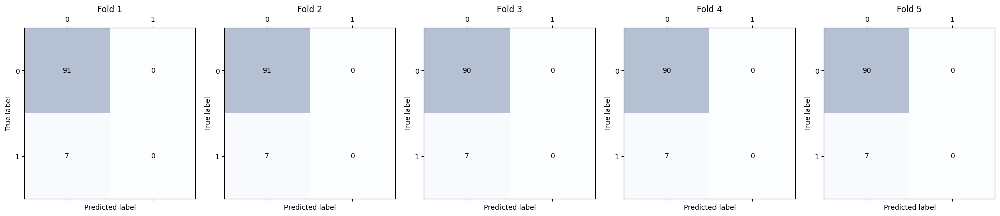

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.1 l1 saga
0.1 l1 saga
0.1 l1 saga
0.1 l1 saga
0.1 l1 saga


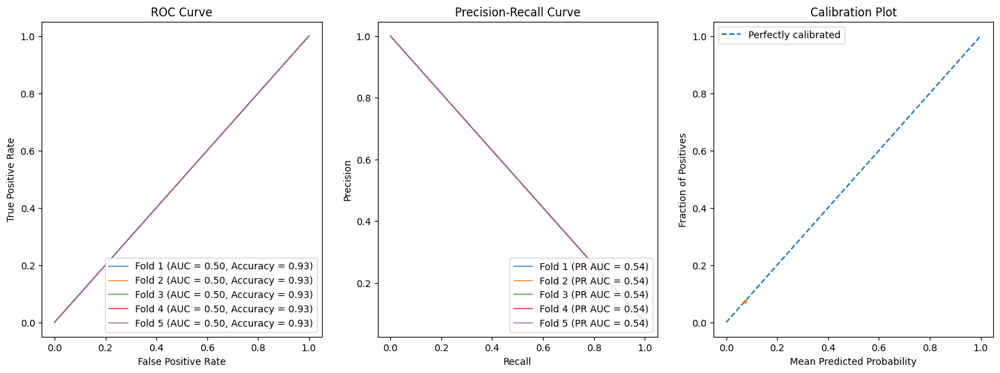

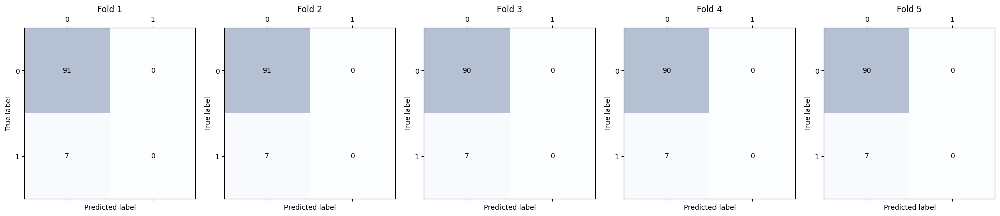

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:

0.1 l2 saga
0.1 l2 saga
0.1 l2 saga
0.1 l2 saga
0.1 l2 saga


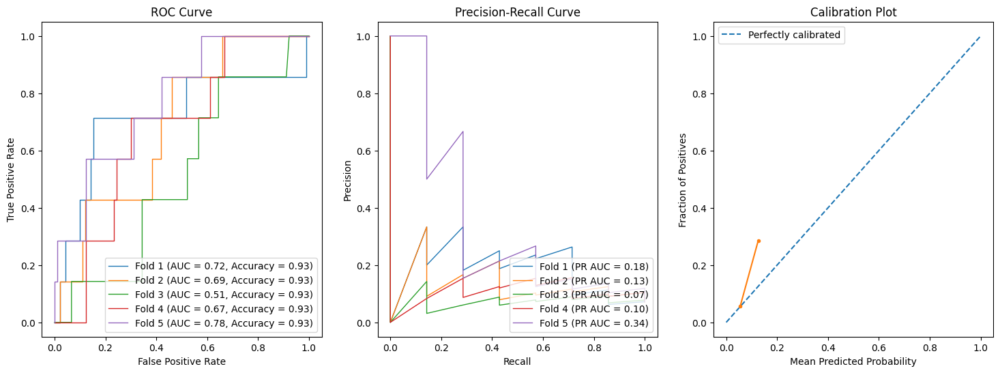

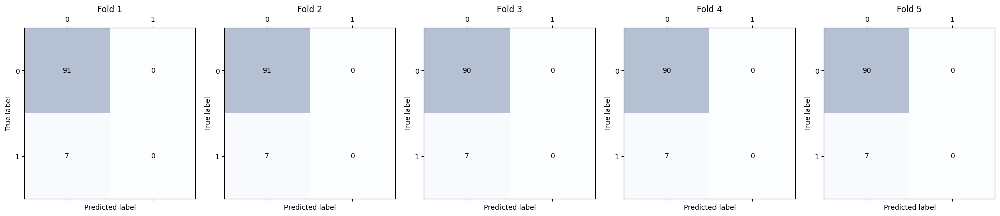

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1.0 l2 newton-cg
1.0 l2 newton-cg
1.0 l2 newton-cg
1.0 l2 newton-cg
1.0 l2 newton-cg


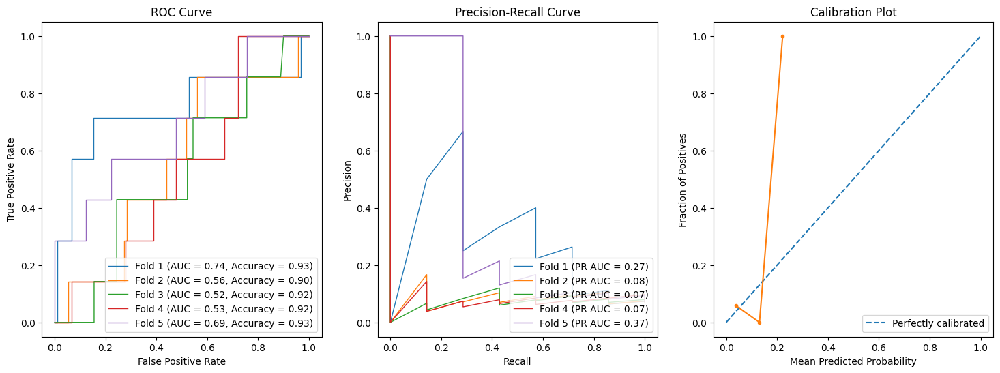

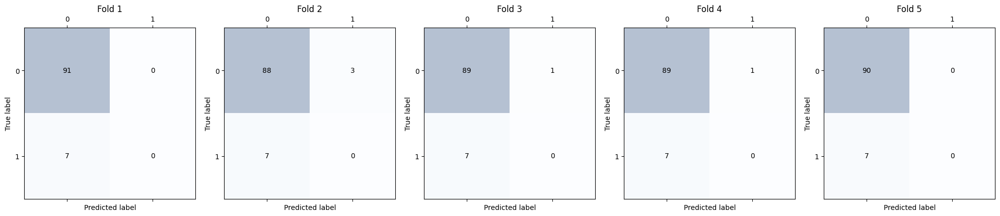

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1.0 l2 lbfgs
1.0 l2 lbfgs
1.0 l2 lbfgs
1.0 l2 lbfgs
1.0 l2 lbfgs


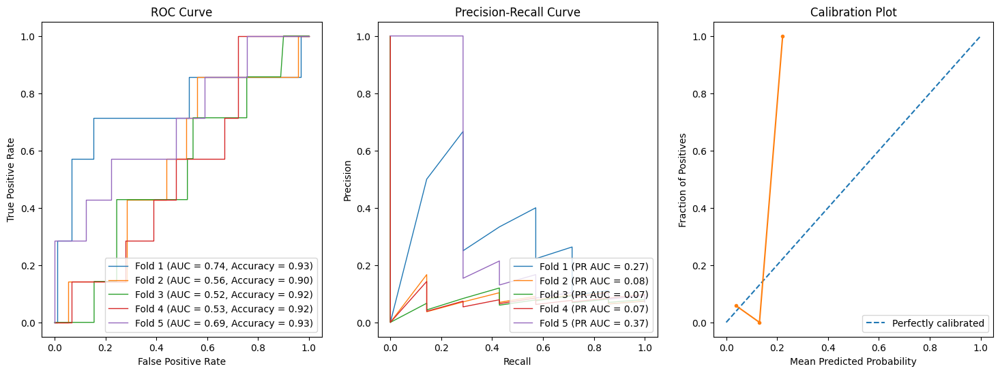

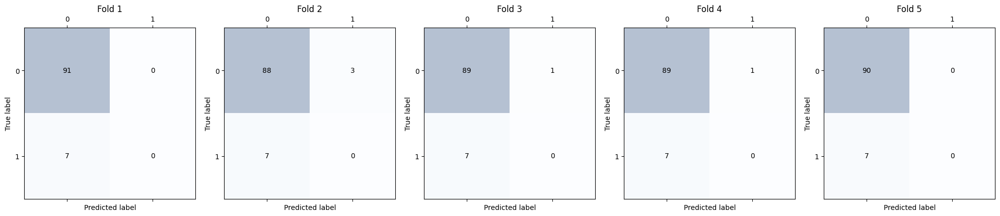

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1.0 l1 liblinear
1.0 l1 liblinear
1.0 l1 liblinear
1.0 l1 liblinear
1.0 l1 liblinear


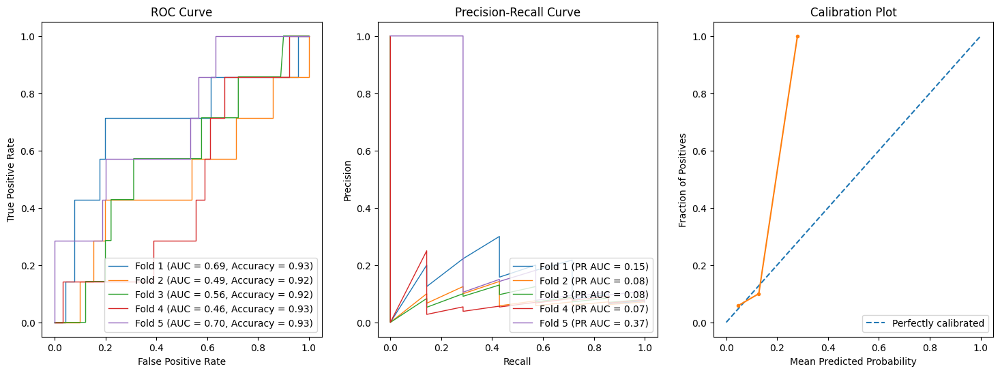

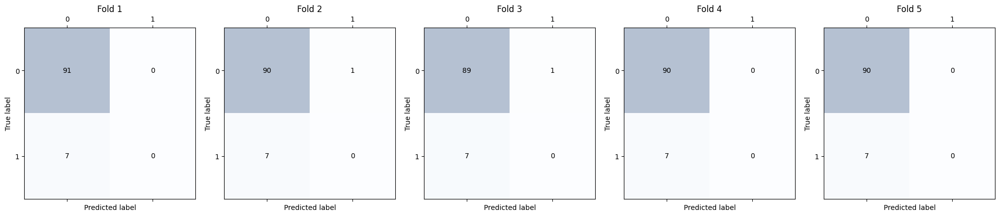

1.0 l2 liblinear
1.0 l2 liblinear
1.0 l2 liblinear
1.0 l2 liblinear
1.0 l2 liblinear


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


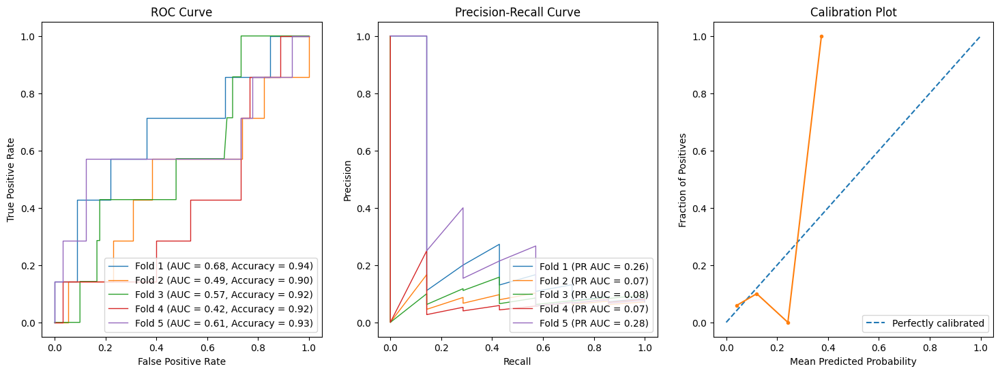

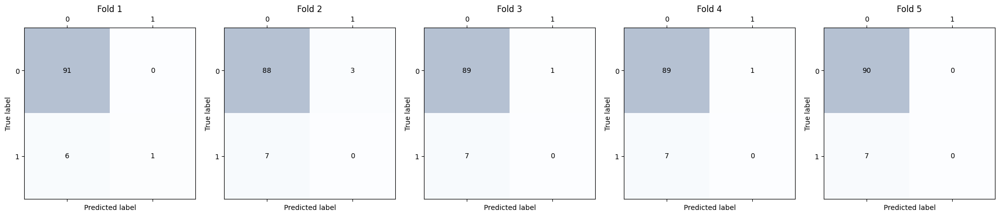

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1.0 l2 sag
1.0 l2 sag
1.0 l2 sag
1.0 l2 sag
1.0 l2 sag


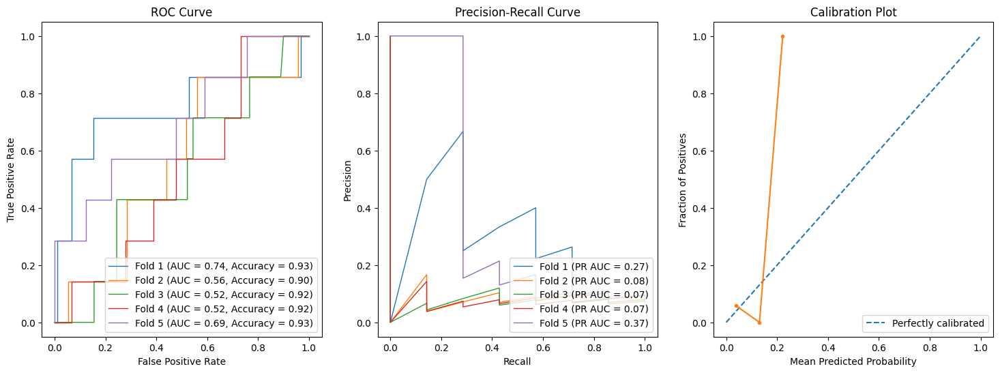

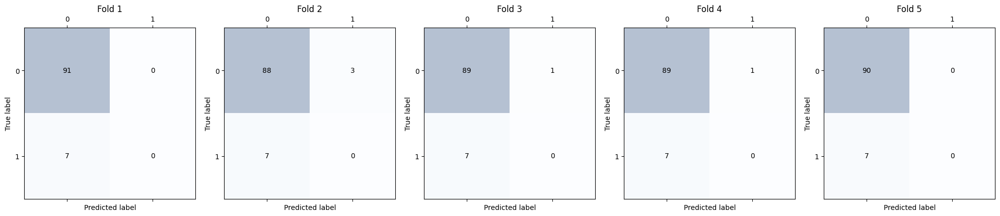

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1.0 l1 saga
1.0 l1 saga
1.0 l1 saga
1.0 l1 saga


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1.0 l1 saga


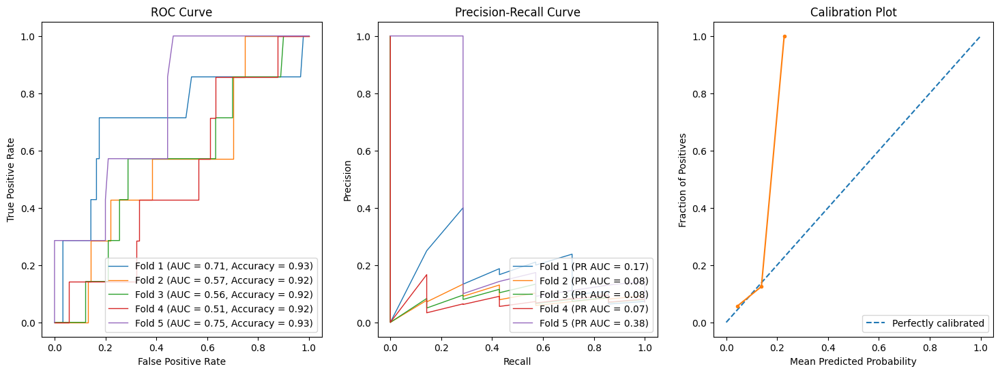

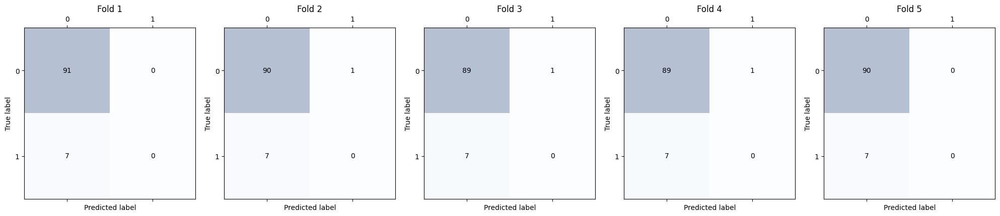

/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1.0 l2 saga
1.0 l2 saga
1.0 l2 saga
1.0 l2 saga
1.0 l2 saga


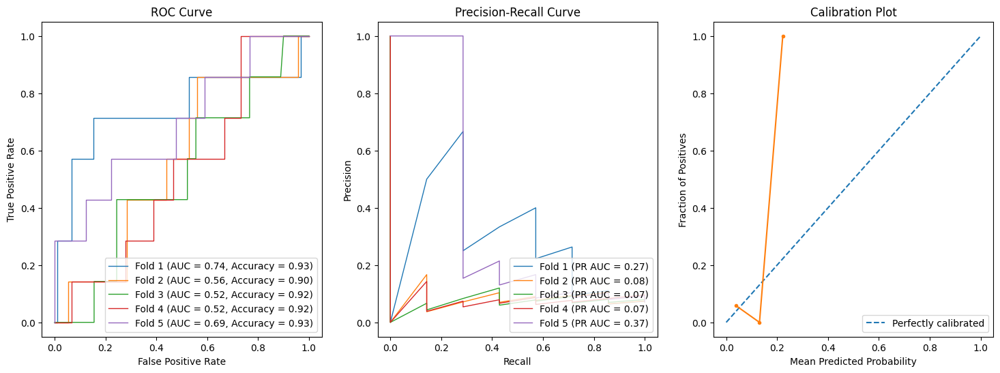

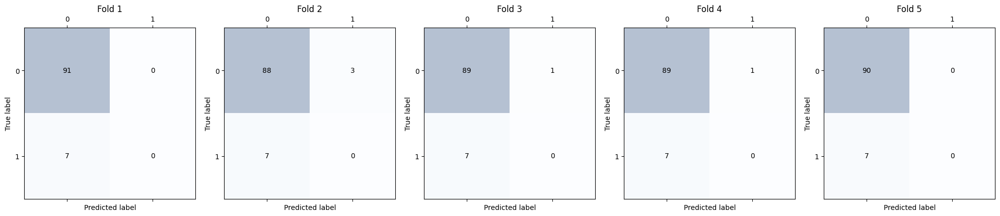

10.0 l2 newton-cg
10.0 l2 newton-cg
10.0 l2 newton-cg
10.0 l2 newton-cg
10.0 l2 newton-cg


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


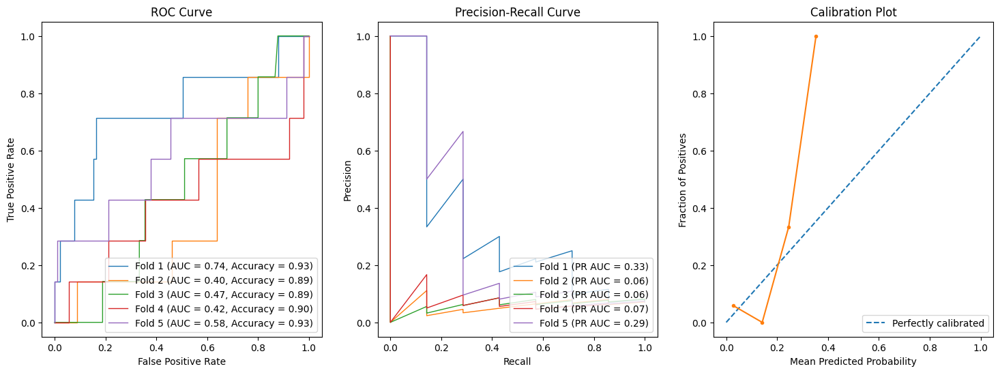

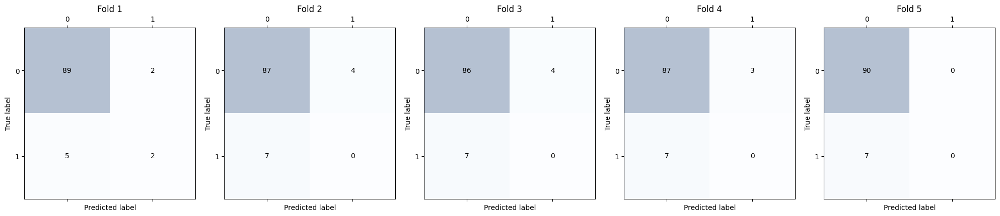

10.0 l2 lbfgs
10.0 l2 lbfgs
10.0 l2 lbfgs
10.0 l2 lbfgs
10.0 l2 lbfgs


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


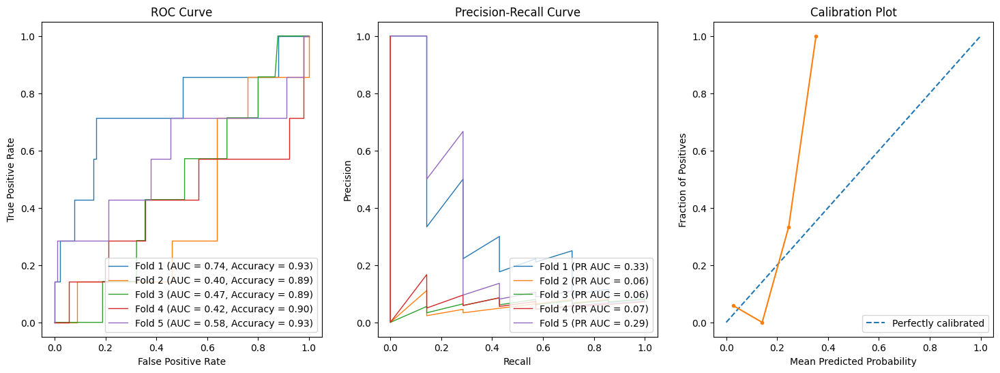

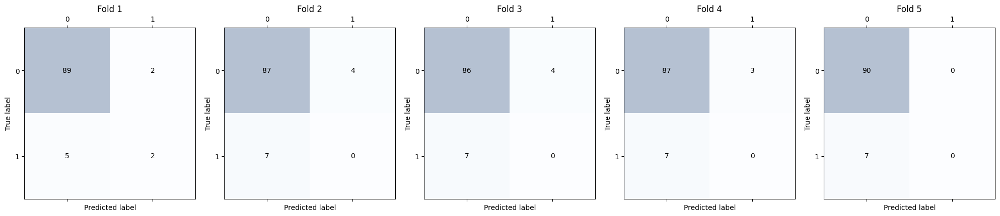

10.0 l1 liblinear
10.0 l1 liblinear
10.0 l1 liblinear
10.0 l1 liblinear
10.0 l1 liblinear


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


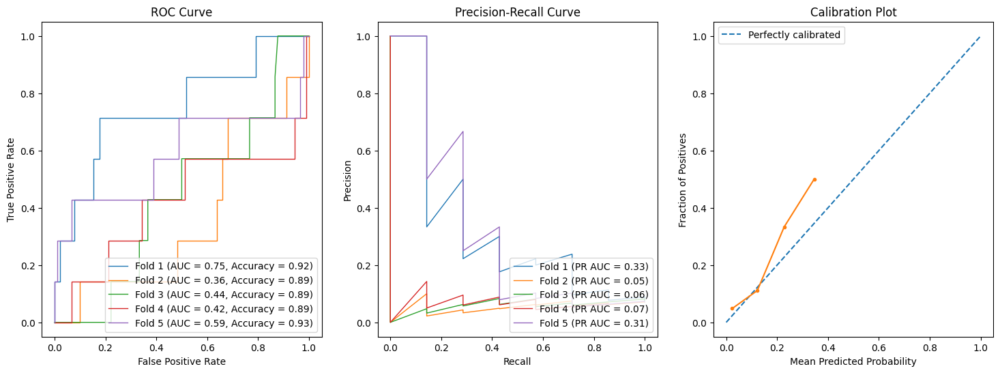

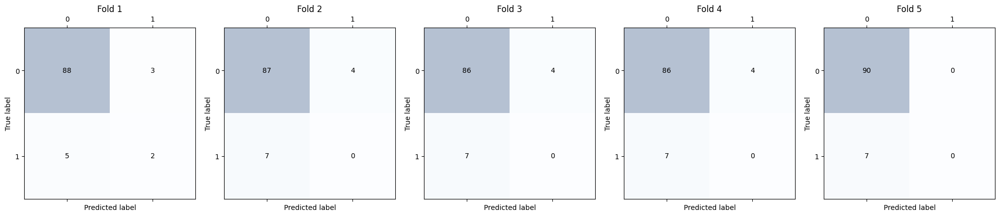

10.0 l2 liblinear
10.0 l2 liblinear
10.0 l2 liblinear
10.0 l2 liblinear
10.0 l2 liblinear


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


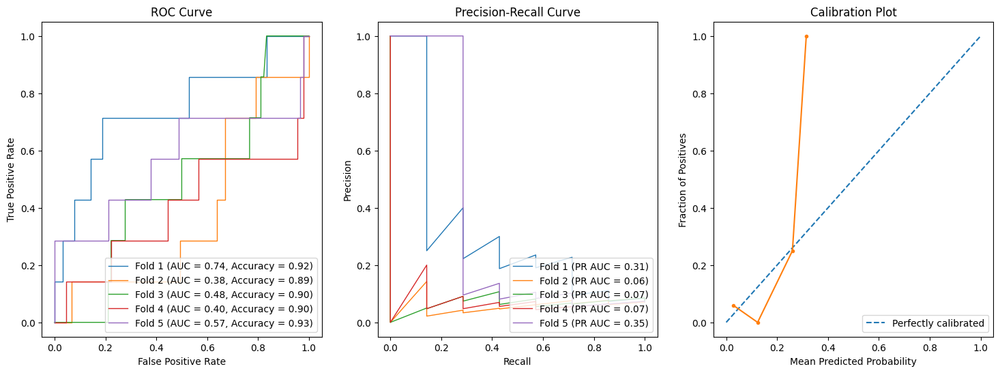

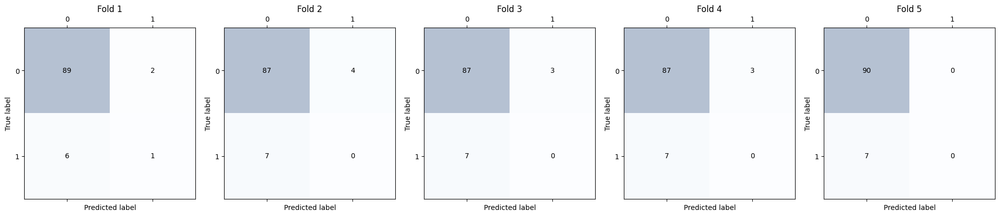

10.0 l2 sag
10.0 l2 sag
10.0 l2 sag
10.0 l2 sag
10.0 l2 sag


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


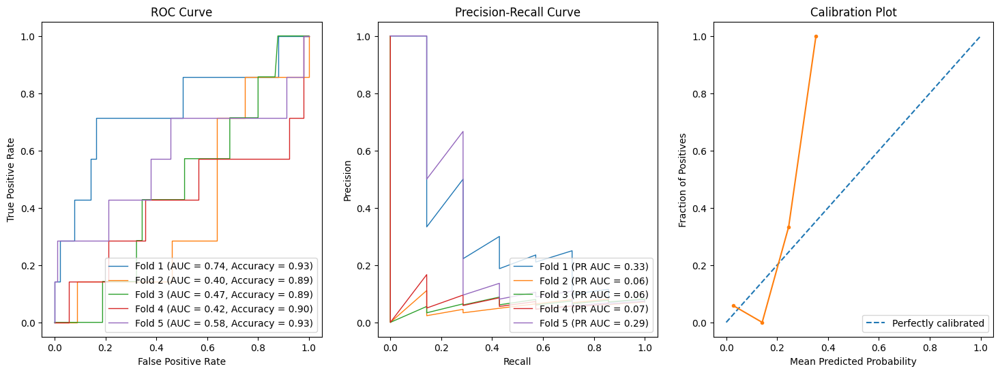

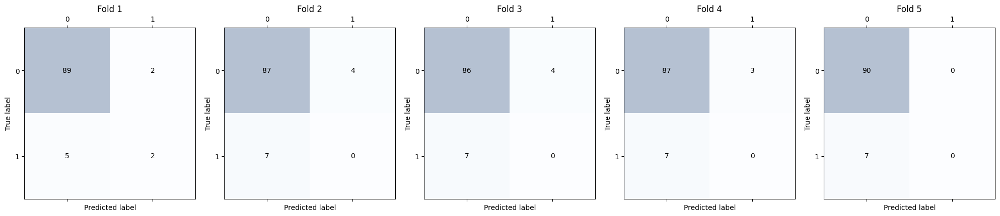

10.0 l1 saga
10.0 l1 saga
10.0 l1 saga
10.0 l1 saga
10.0 l1 saga


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


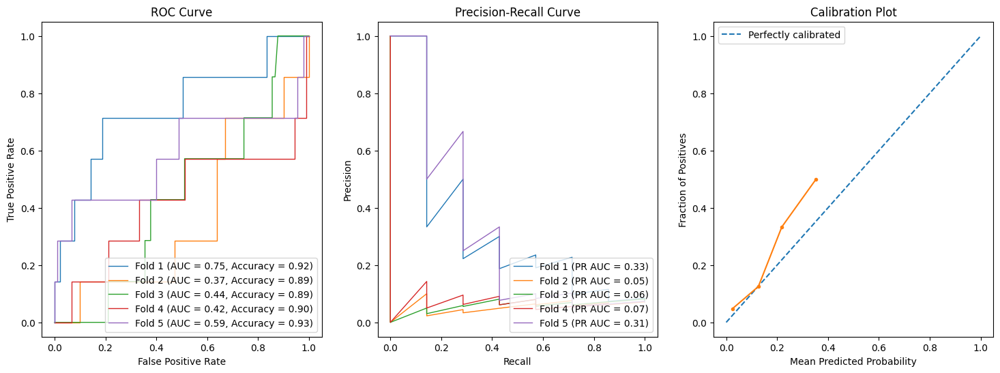

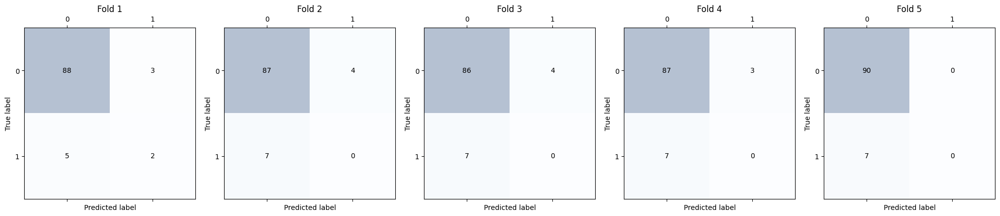

10.0 l2 saga
10.0 l2 saga
10.0 l2 saga
10.0 l2 saga
10.0 l2 saga


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


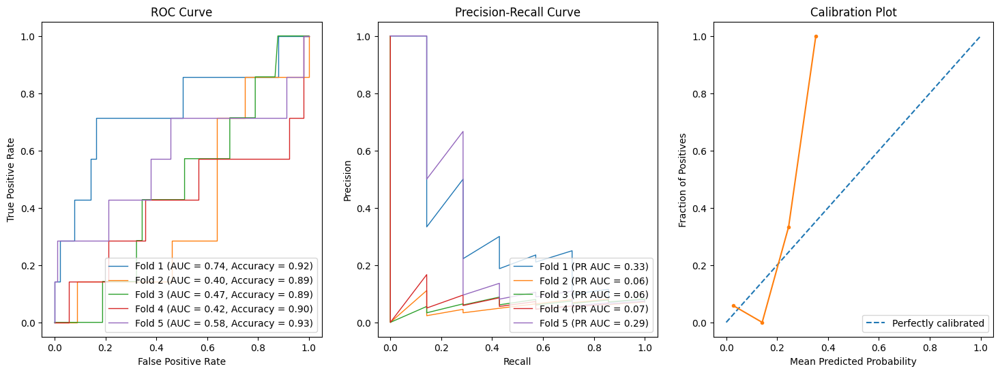

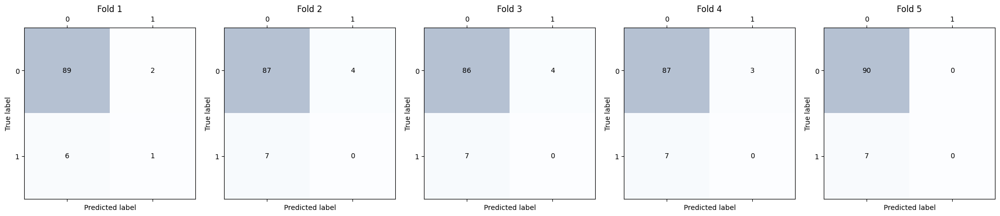

100.0 l2 newton-cg
100.0 l2 newton-cg
100.0 l2 newton-cg
100.0 l2 newton-cg
100.0 l2 newton-cg


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


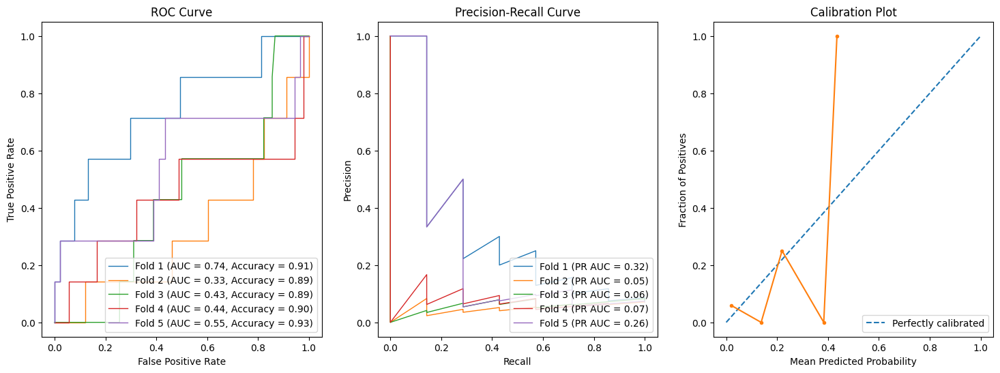

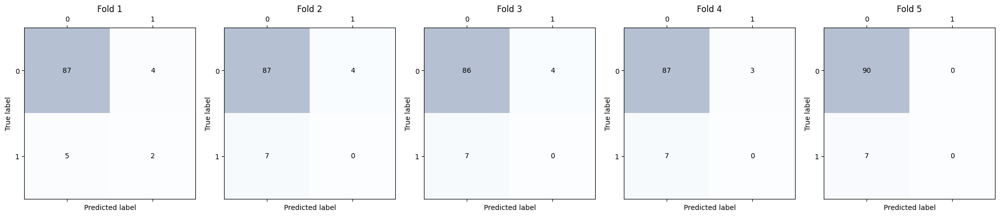

100.0 l2 lbfgs
100.0 l2 lbfgs
100.0 l2 lbfgs
100.0 l2 lbfgs


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


100.0 l2 lbfgs


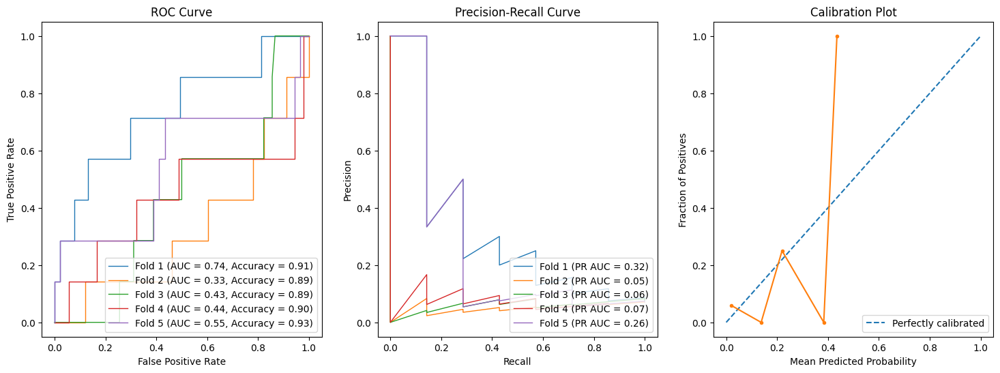

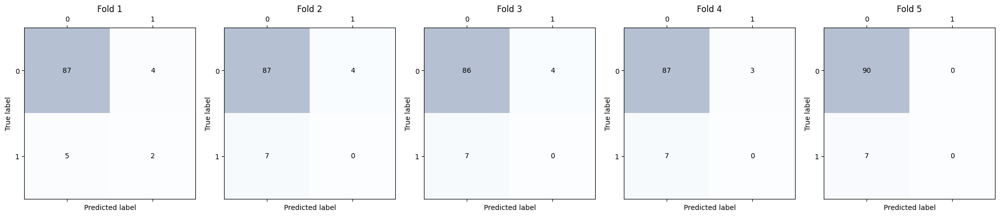

100.0 l1 liblinear
100.0 l1 liblinear
100.0 l1 liblinear
100.0 l1 liblinear
100.0 l1 liblinear


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


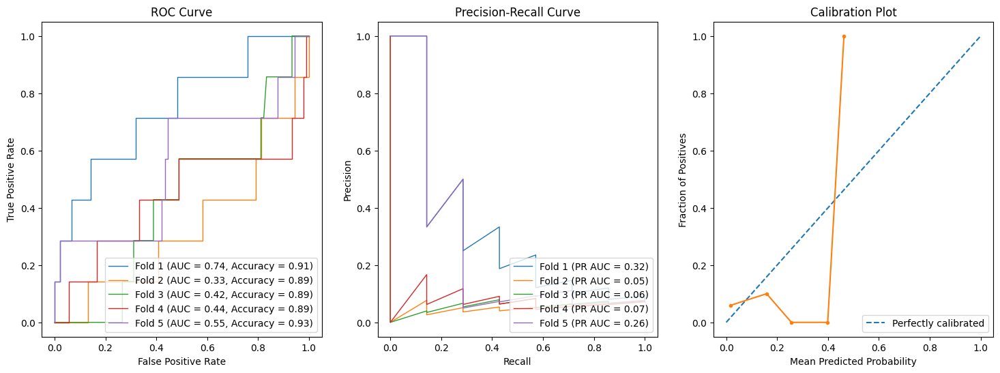

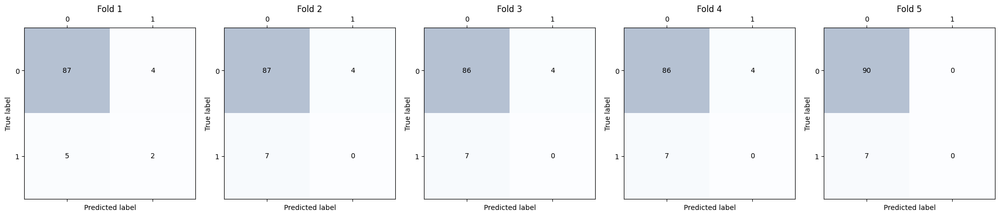

100.0 l2 liblinear
100.0 l2 liblinear
100.0 l2 liblinear
100.0 l2 liblinear
100.0 l2 liblinear


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


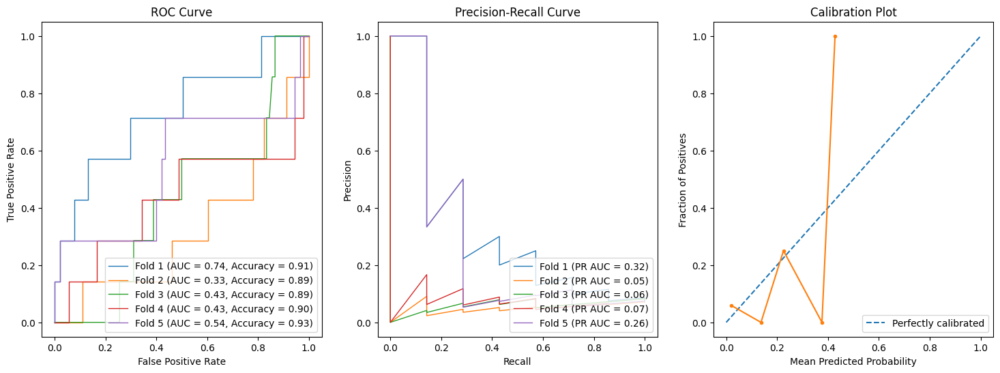

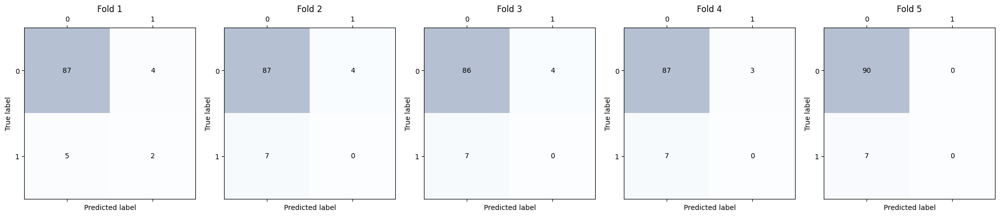

100.0 l2 sag
100.0 l2 sag
100.0 l2 sag
100.0 l2 sag
100.0 l2 sag


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


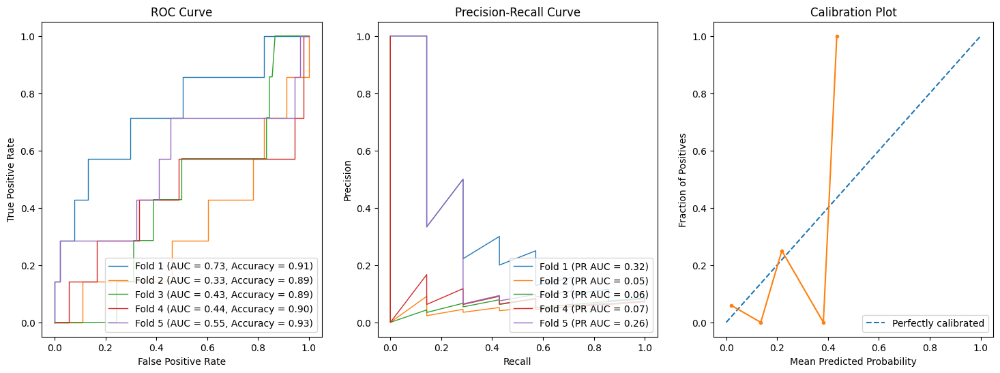

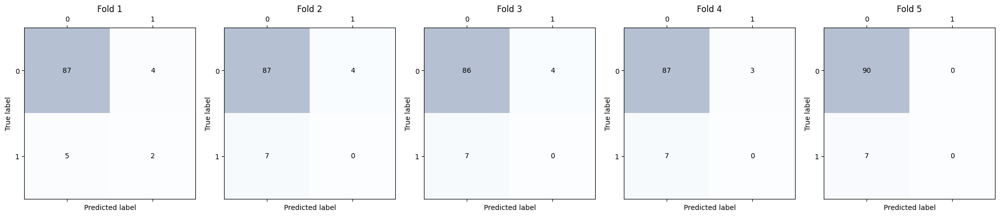

100.0 l1 saga
100.0 l1 saga
100.0 l1 saga
100.0 l1 saga
100.0 l1 saga


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


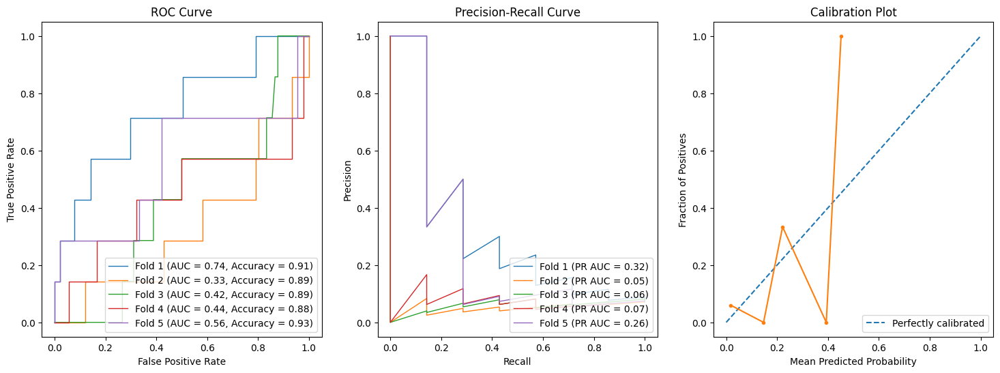

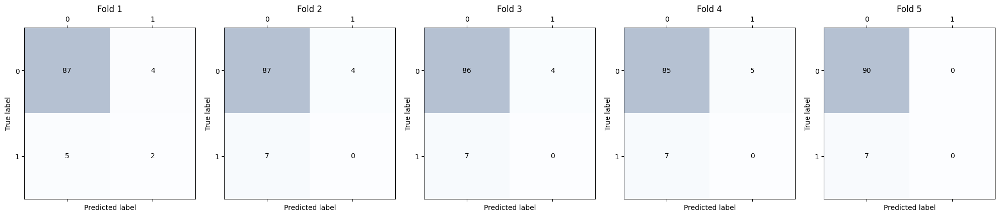

100.0 l2 saga
100.0 l2 saga
100.0 l2 saga
100.0 l2 saga
100.0 l2 saga


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


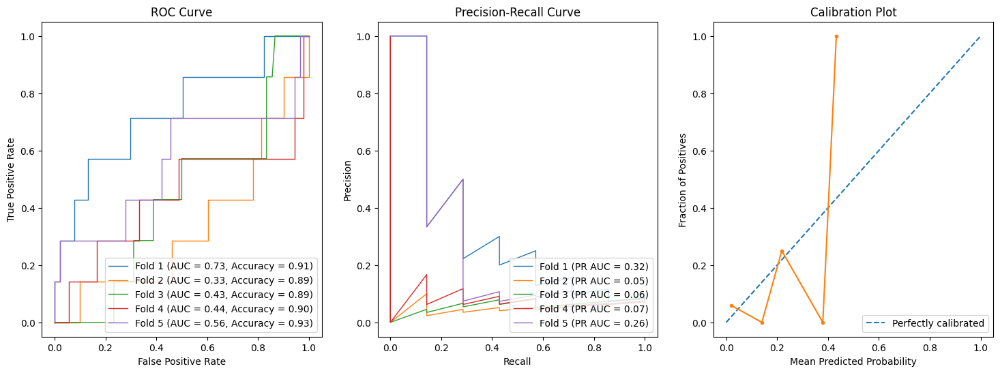

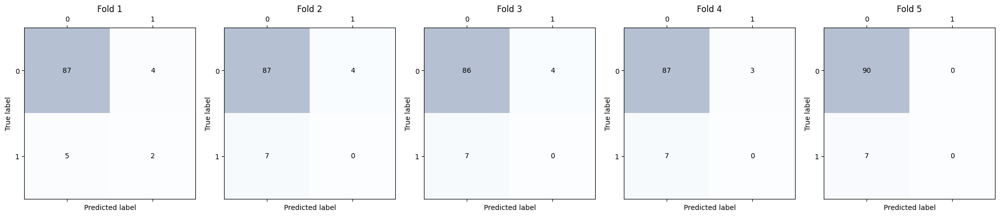

1000.0 l2 newton-cg
1000.0 l2 newton-cg
1000.0 l2 newton-cg
1000.0 l2 newton-cg
1000.0 l2 newton-cg


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


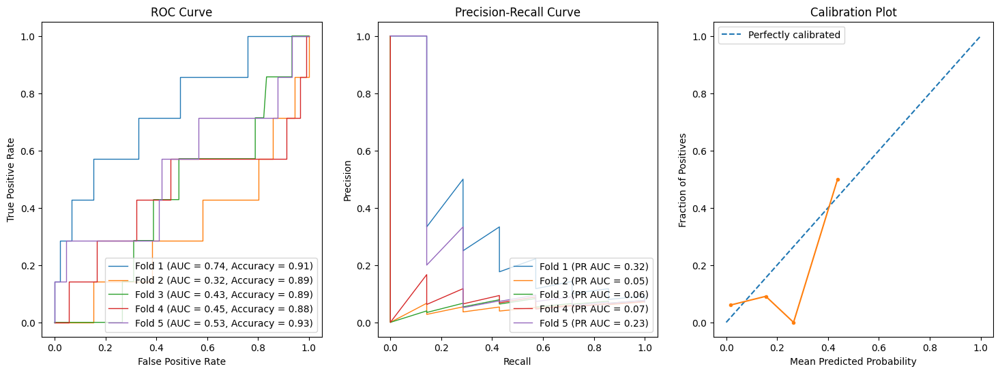

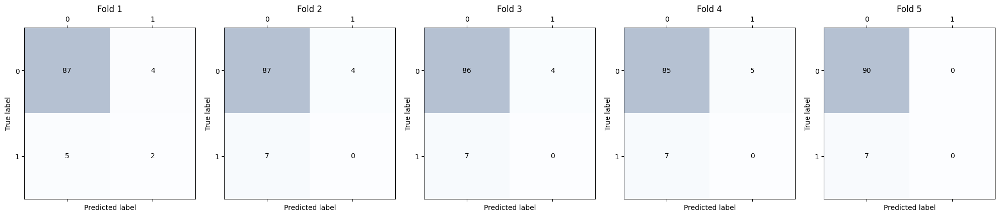

1000.0 l2 lbfgs
1000.0 l2 lbfgs
1000.0 l2 lbfgs
1000.0 l2 lbfgs
1000.0 l2 lbfgs


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


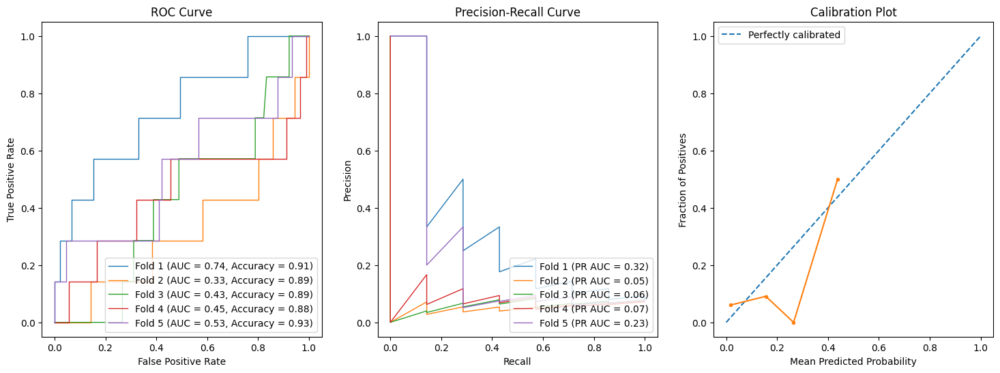

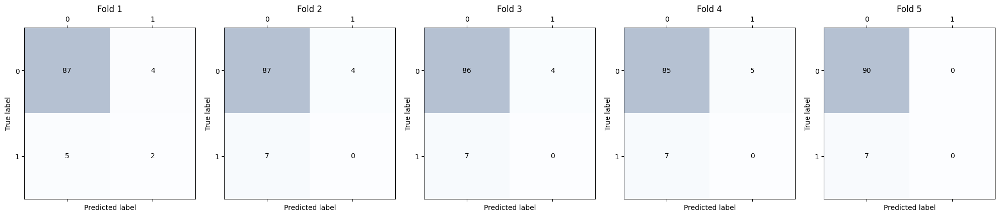

1000.0 l1 liblinear
1000.0 l1 liblinear
1000.0 l1 liblinear
1000.0 l1 liblinear
1000.0 l1 liblinear


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


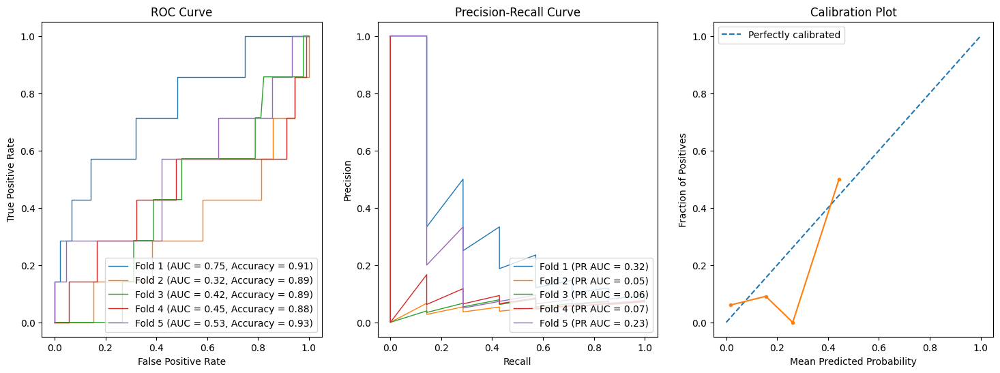

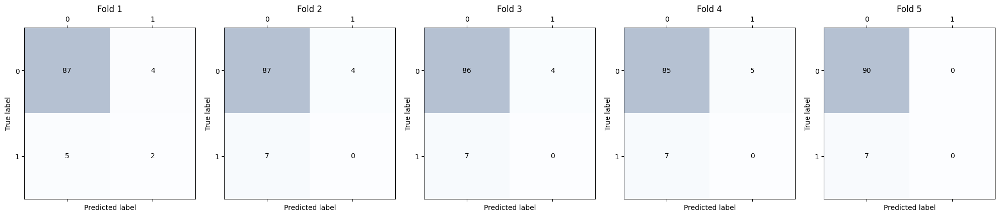

1000.0 l2 liblinear
1000.0 l2 liblinear
1000.0 l2 liblinear
1000.0 l2 liblinear
1000.0 l2 liblinear


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


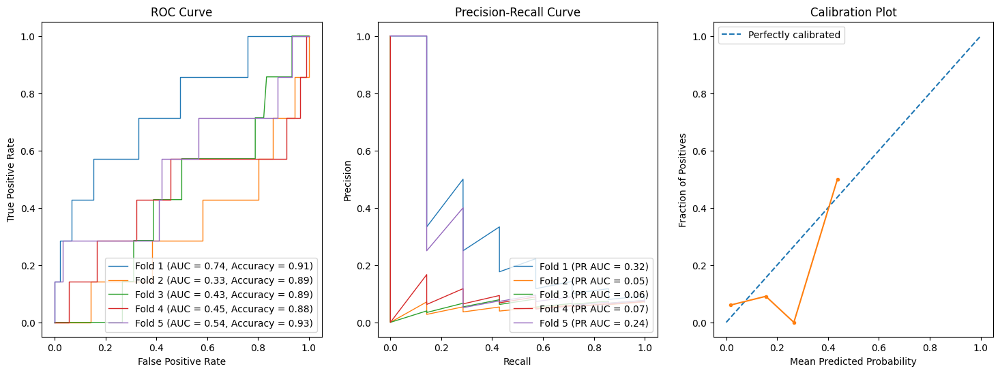

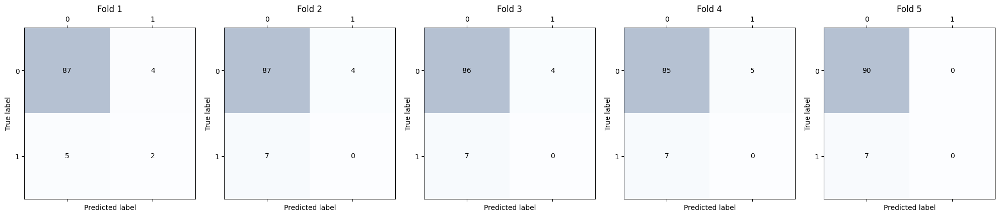

1000.0 l2 sag
1000.0 l2 sag
1000.0 l2 sag
1000.0 l2 sag
1000.0 l2 sag


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


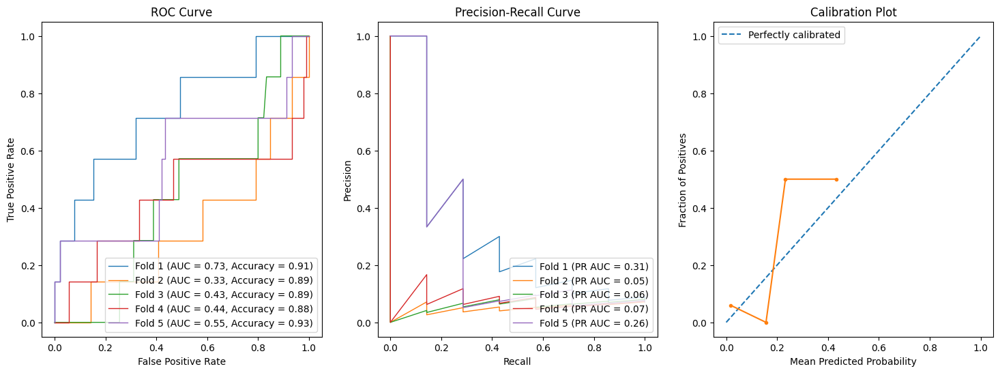

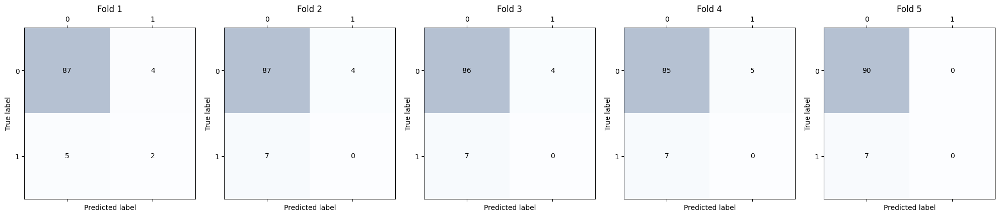

1000.0 l1 saga
1000.0 l1 saga
1000.0 l1 saga
1000.0 l1 saga


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1000.0 l1 saga


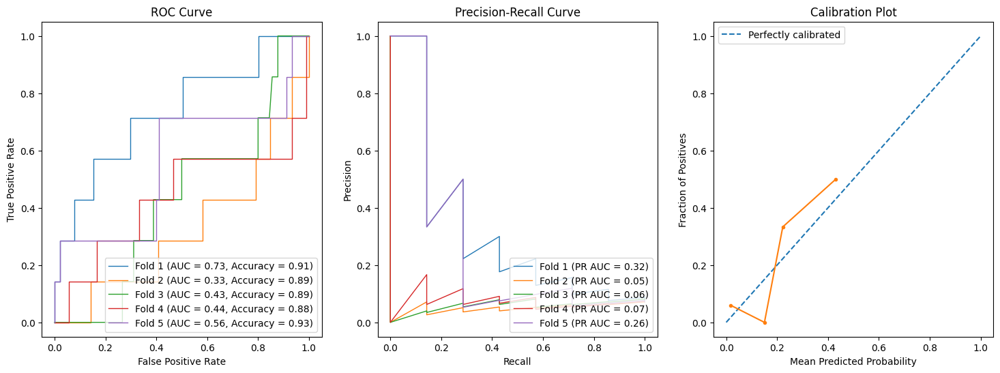

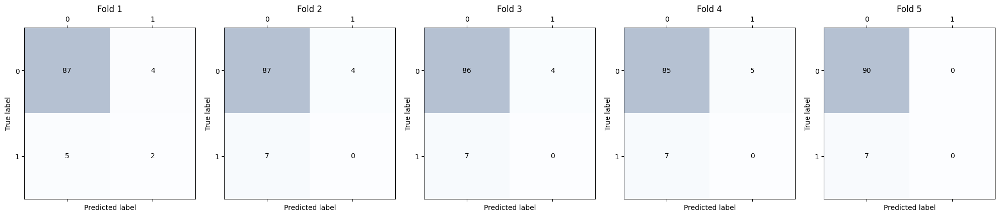

1000.0 l2 saga
1000.0 l2 saga
1000.0 l2 saga
1000.0 l2 saga
1000.0 l2 saga


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


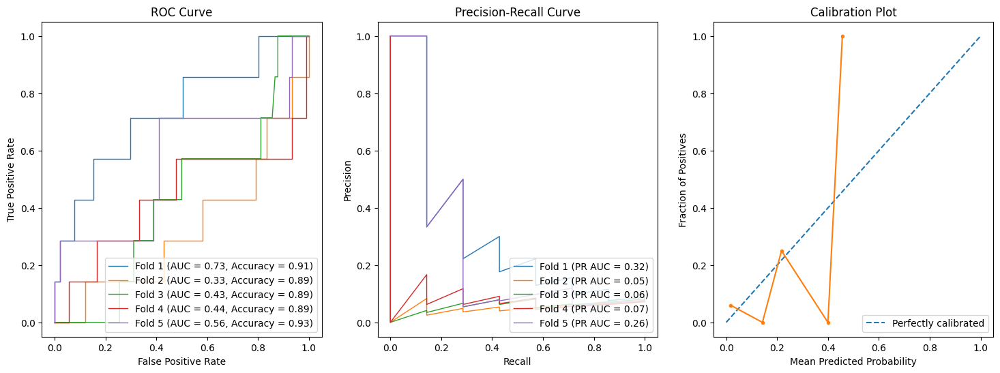

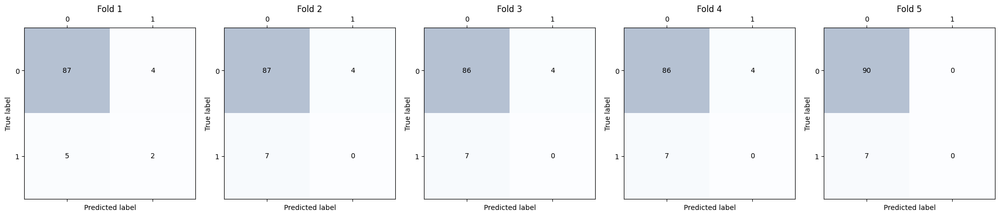

In [24]:
X = covidML.drop(columns=["longcovid_six"])
y = covidML["longcovid_six"]

C_values = np.logspace(-3, 3, 7)
results_logistic = train_and_evaluate_logistic(X, y, C_values)

In [25]:
logistic_results_df = pd.DataFrame(results_logistic)
logistic_results_df

,Config,Average Accuracy,Average ROC AUC,Average PR AUC,Average Precision,Average Recall,Average F1,Average Specificity,Total Computation Time
0,LogReg; C=0.001; Penalty=l2; Solver=newton-cg,0.928130,0.671193,0.135319,0.000000,0.000000,0.000000,1.000000,0.056188
1,LogReg; C=0.001; Penalty=l2; Solver=lbfgs,0.928130,0.671193,0.135319,0.000000,0.000000,0.000000,1.000000,0.055577
2,LogReg; C=0.001; Penalty=l1; Solver=liblinear,0.928130,0.500000,0.535935,0.000000,0.000000,0.000000,1.000000,0.020874
3,LogReg; C=0.001; Penalty=l2; Solver=liblinear,0.928130,0.400330,0.063386,0.000000,0.000000,0.000000,1.000000,0.029252
4,LogReg; C=0.001; Penalty=l2; Solver=sag,0.928130,0.671193,0.135319,0.000000,0.000000,0.000000,1.000000,0.027834
5,LogReg; C=0.001; Penalty=l1; Solver=saga,0.928130,0.500000,0.535935,0.000000,0.000000,0.000000,1.000000,0.018984
6,LogReg; C=0.001; Penalty=l2; Solver=saga,0.928130,0.671193,0.135319,0.000000,0.000000,0.000000,1.000000,0.034448
7,LogReg; C=0.01; Penalty=l2; Solver=newton-cg,0.928130,0.680078,0.136640,0.000000,0.000000,0.000000,1.000000,0.061442
8,LogReg; C=0.01; Penalty=l2; Solver=lbfgs,0.928130,0.680078,0.136640,0.000000,0.000000,0.000000,1.000000,0.049381
9,LogReg; C=0.01; Penalty=l1; Solver=liblinear,0.928130,0.443073,0.089770,0.000000,0.000000,0.000000,1.000000,0.019562


In [26]:
# get the system's virtual memory
vm = psutil.virtual_memory()

# print the total, available, and used memory in the system
print(f"Total memory: {vm.total/(1024*1024*1024):.2f} GB")
print(f"Available memory: {vm.available/(1024*1024*1024):.2f} GB")
print(f"Used memory: {vm.used/(1024*1024*1024):.2f} GB")

Total memory: 16.00 GB
Available memory: 2.74 GB
Used memory: 4.86 GB
